In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"✅ Drive mounted!")
print(f"🖥️  Device: {device}")
print(f"🔥 GPU: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else '❌ No GPU — go to Runtime > Change runtime type > T4 GPU'}")

Mounted at /content/drive
✅ Drive mounted!
🖥️  Device: cpu
🔥 GPU: ❌ No GPU — go to Runtime > Change runtime type > T4 GPU


In [ ]:
import os
from google.colab import files

# ── Upload kaggle.json ─────────────────────────────────────
print("📂 A file picker will appear — select your kaggle.json file...")
uploaded = files.upload()

# ── Configure Kaggle API ───────────────────────────────────
os.makedirs('/root/.config/kaggle', exist_ok=True)
os.rename('/content/kaggle.json', '/root/.config/kaggle/kaggle.json')
os.chmod('/root/.config/kaggle/kaggle.json', 0o600)
print("✅ Kaggle API configured!")

# ── Download dataset into Colab temp storage (NOT Drive) ───
print("\n⏳ Downloading dataset... (~5-10 minutes)")
!kaggle datasets download -d manjilkarki/deepfake-and-real-images -p /content/deepfake_data/
print("✅ Download complete!")

📂 A file picker will appear — select your kaggle.json file...


Saving kaggle.json to kaggle.json
✅ Kaggle API configured!

⏳ Downloading dataset... (~5-10 minutes)
Dataset URL: https://www.kaggle.com/datasets/manjilkarki/deepfake-and-real-images
License(s): unknown
100% 1.68G/1.68G [00:19<00:00, 91.1MB/s]

✅ Download complete!


In [ ]:
import os

print("⏳ Unzipping... (may take 2-3 minutes for 60K images)")
!unzip -q /content/deepfake_data/*.zip -d /content/deepfake_data/
print("✅ Unzip complete!")

# ── Check what folders exist ───────────────────────────────
print("\n📁 Checking folder structure...")
base = '/content/deepfake_data/'
for item in os.listdir(base):
    item_path = os.path.join(base, item)
    if os.path.isdir(item_path):
        count = sum([len(f) for r, d, f in os.walk(item_path)])
        print(f"   {item}/  →  {count:,} files")
    else:
        size = os.path.getsize(item_path) / (1024*1024)
        print(f"   {item}  ({size:.1f} MB)")

⏳ Unzipping... (may take 2-3 minutes for 60K images)
✅ Unzip complete!

📁 Checking folder structure...
   deepfake-and-real-images.zip  (1724.9 MB)
   Dataset/  →  190,335 files


In [ ]:
import os

base = '/content/deepfake_data/Dataset/'

print("📁 Full folder structure:")
for level1 in os.listdir(base):
    path1 = os.path.join(base, level1)
    if os.path.isdir(path1):
        print(f"\n📂 {level1}/")
        for level2 in os.listdir(path1):
            path2 = os.path.join(path1, level2)
            if os.path.isdir(path2):
                count = len([f for f in os.listdir(path2)
                             if f.lower().endswith(('.jpg','.jpeg','.png'))])
                print(f"   📁 {level2}/  →  {count:,} images")
            else:
                print(f"   📄 {level2}")

📁 Full folder structure:

📂 Test/
   📁 Fake/  →  5,492 images
   📁 Real/  →  5,413 images

📂 Validation/
   📁 Fake/  →  19,641 images
   📁 Real/  →  19,787 images

📂 Train/
   📁 Fake/  →  70,001 images
   📁 Real/  →  70,001 images


In [ ]:
!pip install -q torchvision

import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import (accuracy_score, precision_score,
                             recall_score, f1_score,
                             confusion_matrix, classification_report)
import warnings
warnings.filterwarnings('ignore')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print("✅ All libraries imported!")
print(f"🖥️  Device : {device}")
print(f"🔥 GPU    : {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'Not available'}")

✅ All libraries imported!
🖥️  Device : cpu
🔥 GPU    : Not available


In [ ]:
from google.colab import drive

# Google Drive paths (for saving model + graphs)
BASE_PATH        = "/content/drive/MyDrive/AI_FakeNews_Deepfake_Project"
MODEL_SAVE_PATH  = os.path.join(BASE_PATH, "models/cnn_model")
GRAPHS_SAVE_PATH = os.path.join(BASE_PATH, "outputs/graphs")

os.makedirs(MODEL_SAVE_PATH,  exist_ok=True)
os.makedirs(GRAPHS_SAVE_PATH, exist_ok=True)

# Dataset paths (Colab temp storage)
DATASET_BASE = "/content/deepfake_data/Dataset"
TRAIN_DIR    = os.path.join(DATASET_BASE, "Train")
VAL_DIR      = os.path.join(DATASET_BASE, "Validation")
TEST_DIR     = os.path.join(DATASET_BASE, "Test")

print("✅ All paths configured!")
print(f"   Train      : {TRAIN_DIR}")
print(f"   Validation : {VAL_DIR}")
print(f"   Test       : {TEST_DIR}")
print(f"   Model save : {MODEL_SAVE_PATH}")
print(f"   Graphs     : {GRAPHS_SAVE_PATH}")

✅ All paths configured!
   Train      : /content/deepfake_data/Dataset/Train
   Validation : /content/deepfake_data/Dataset/Validation
   Test       : /content/deepfake_data/Dataset/Test
   Model save : /content/drive/MyDrive/AI_FakeNews_Deepfake_Project/models/cnn_model
   Graphs     : /content/drive/MyDrive/AI_FakeNews_Deepfake_Project/outputs/graphs


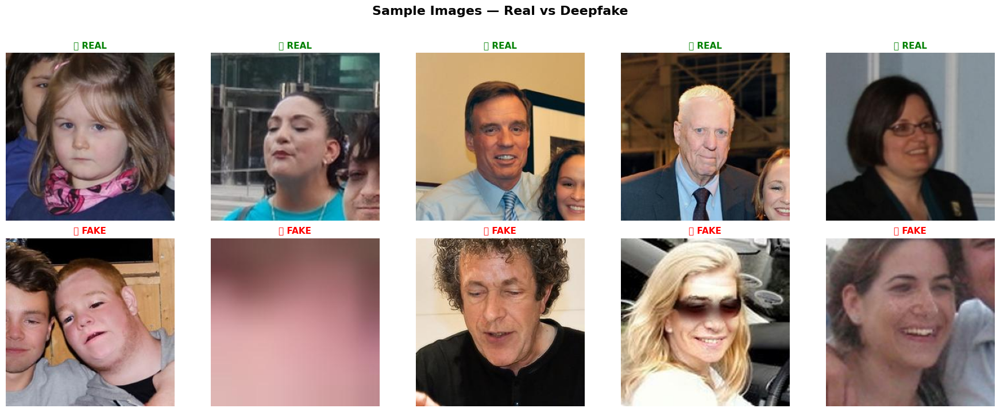

✅ Sample images saved to Drive!


In [ ]:
import random
from PIL import Image

fig, axes = plt.subplots(2, 5, figsize=(18, 7))

for col, label in enumerate(['Real', 'Fake']):
    folder = os.path.join(TRAIN_DIR, label)
    images = random.sample(os.listdir(folder), 5)
    for row, img_name in enumerate(images):
        img = Image.open(os.path.join(folder, img_name)).convert('RGB')
        ax  = axes[col][row]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(
            f"{'🟢 REAL' if label=='Real' else '🔴 FAKE'}",
            fontsize=11, fontweight='bold',
            color='green' if label=='Real' else 'red'
        )

plt.suptitle('Sample Images — Real vs Deepfake',
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(f"{GRAPHS_SAVE_PATH}/sample_images.png",
            dpi=150, bbox_inches='tight')
plt.show()
print("✅ Sample images saved to Drive!")

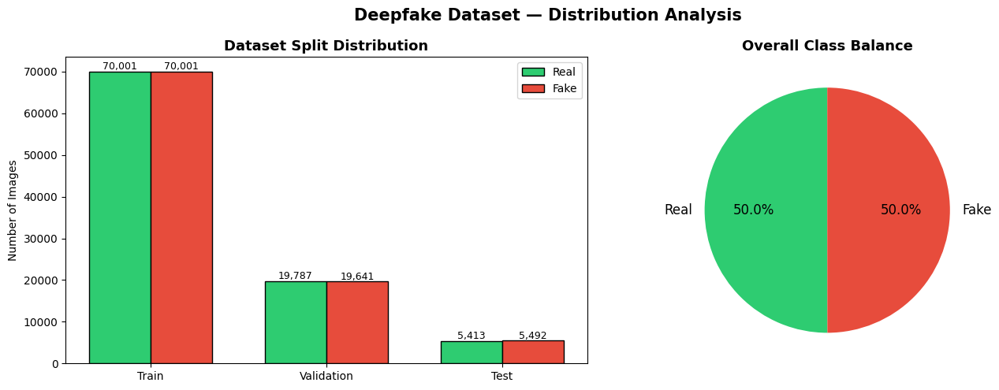

✅ Distribution graph saved to Drive!


In [ ]:
splits  = ['Train', 'Validation', 'Test']
reals   = [70001, 19787, 5413]
fakes   = [70001, 19641, 5492]

x     = np.arange(len(splits))
width = 0.35

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Grouped bar chart
bars1 = axes[0].bar(x - width/2, reals, width,
                    label='Real', color='#2ecc71', edgecolor='black')
bars2 = axes[0].bar(x + width/2, fakes, width,
                    label='Fake', color='#e74c3c', edgecolor='black')
axes[0].set_xticks(x)
axes[0].set_xticklabels(splits)
axes[0].set_title('Dataset Split Distribution',
                  fontsize=13, fontweight='bold')
axes[0].set_ylabel('Number of Images')
axes[0].legend()
for bar in bars1:
    axes[0].text(bar.get_x() + bar.get_width()/2,
                 bar.get_height() + 500,
                 f'{bar.get_height():,}',
                 ha='center', fontsize=9)
for bar in bars2:
    axes[0].text(bar.get_x() + bar.get_width()/2,
                 bar.get_height() + 500,
                 f'{bar.get_height():,}',
                 ha='center', fontsize=9)

# Pie chart — total
total_real = sum(reals)
total_fake = sum(fakes)
axes[1].pie([total_real, total_fake],
            labels=['Real', 'Fake'],
            colors=['#2ecc71', '#e74c3c'],
            autopct='%1.1f%%', startangle=90,
            textprops={'fontsize': 12})
axes[1].set_title('Overall Class Balance',
                  fontsize=13, fontweight='bold')

plt.suptitle('Deepfake Dataset — Distribution Analysis',
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig(f"{GRAPHS_SAVE_PATH}/deepfake_distribution.png",
            dpi=150, bbox_inches='tight')
plt.show()
print("✅ Distribution graph saved to Drive!")

In [ ]:
# ── Image config ────────────────────────────────────────────
IMG_SIZE   = 224      # EfficientNetB0 standard input size
BATCH_SIZE = 32       # Larger batch = faster training on GPU
NUM_WORKERS = 2

# ── Transforms ──────────────────────────────────────────────
# Train: augmentation to prevent overfitting
train_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.2,
                           contrast=0.2,
                           saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

# Val/Test: only resize + normalize (no augmentation)
val_test_transforms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

# ── Datasets ─────────────────────────────────────────────────
train_dataset = datasets.ImageFolder(TRAIN_DIR, transform=train_transforms)
val_dataset   = datasets.ImageFolder(VAL_DIR,   transform=val_test_transforms)
test_dataset  = datasets.ImageFolder(TEST_DIR,  transform=val_test_transforms)

# ── DataLoaders ──────────────────────────────────────────────
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                          shuffle=True,  num_workers=NUM_WORKERS,
                          pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=NUM_WORKERS,
                          pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=NUM_WORKERS,
                          pin_memory=True)

# ── Class mapping ─────────────────────────────────────────────
print(f"✅ DataLoaders ready!")
print(f"\n📊 Class mapping : {train_dataset.class_to_idx}")
print(f"   Train batches : {len(train_loader):,}")
print(f"   Val batches   : {len(val_loader):,}")
print(f"   Test batches  : {len(test_loader):,}")
print(f"\n   Train images  : {len(train_dataset):,}")
print(f"   Val images    : {len(val_dataset):,}")
print(f"   Test images   : {len(test_dataset):,}")

✅ DataLoaders ready!

📊 Class mapping : {'Fake': 0, 'Real': 1}
   Train batches : 4,376
   Val batches   : 1,233
   Test batches  : 341

   Train images  : 140,002
   Val images    : 39,428
   Test images   : 10,905


In [ ]:
def build_efficientnet(num_classes=2, dropout=0.3):
    """
    EfficientNetB0 pretrained on ImageNet.
    We freeze early layers and replace the classifier head
    with our own for binary deepfake detection.
    """
    # Load pretrained model
    model = models.efficientnet_b0(weights='IMAGENET1K_V1')

    # Freeze all base layers (keep ImageNet knowledge)
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze last 3 blocks for fine-tuning
    for param in model.features[6:].parameters():
        param.requires_grad = True

    # Replace classifier head for our binary task
    in_features = model.classifier[1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=dropout),
        nn.Linear(in_features, 512),
        nn.ReLU(),
        nn.Dropout(p=dropout/2),
        nn.Linear(512, num_classes)
    )

    return model

model = build_efficientnet(num_classes=2, dropout=0.3)
model = model.to(device)

# Count parameters
total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters()
                       if p.requires_grad)

print(f"✅ EfficientNetB0 model built!")
print(f"   Total parameters    : {total_params:,}")
print(f"   Trainable parameters: {trainable_params:,}")
print(f"   Frozen parameters   : {total_params - trainable_params:,}")
print(f"\n💡 Strategy: ImageNet weights frozen → only top layers fine-tuned")
print(f"   This gives high accuracy with less training time!")

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 31.5MB/s]


✅ EfficientNetB0 model built!
   Total parameters    : 4,664,446
   Trainable parameters: 3,812,638
   Frozen parameters   : 851,808

💡 Strategy: ImageNet weights frozen → only top layers fine-tuned
   This gives high accuracy with less training time!


In [ ]:
EPOCHS        = 10
LEARNING_RATE = 1e-4

# Loss function
criterion = nn.CrossEntropyLoss()

# Only optimize trainable parameters
optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LEARNING_RATE,
    weight_decay=1e-4
)

# Reduce LR when validation loss plateaus (verbose removed for newer PyTorch)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode     = 'min',
    factor   = 0.3,
    patience = 2
)

print(f"✅ Training config ready!")
print(f"   Epochs        : {EPOCHS}")
print(f"   Learning rate : {LEARNING_RATE}")
print(f"   Optimizer     : AdamW (weight_decay=1e-4)")
print(f"   Scheduler     : ReduceLROnPlateau (patience=2)")
print(f"   Loss          : CrossEntropyLoss")
print(f"\n⏱️  Estimated training time: ~1.5-2 hrs on T4 GPU")

✅ Training config ready!
   Epochs        : 10
   Learning rate : 0.0001
   Optimizer     : AdamW (weight_decay=1e-4)
   Scheduler     : ReduceLROnPlateau (patience=2)
   Loss          : CrossEntropyLoss

⏱️  Estimated training time: ~1.5-2 hrs on T4 GPU


In [ ]:
# ── Training Function ────────────────────────────────────────
def train_epoch(model, loader, criterion, optimizer, device):
    model.train()
    total_loss, correct, total = 0, 0, 0

    for batch_idx, (images, labels) in enumerate(loader):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        total_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

        if (batch_idx + 1) % 500 == 0:
            print(f"   Step {batch_idx+1:>4}/{len(loader)} | "
                  f"Loss: {loss.item():.4f} | "
                  f"Acc: {correct/total*100:.2f}%")

    return total_loss / len(loader), correct / total


# ── Validation Function ──────────────────────────────────────
def eval_epoch(model, loader, criterion, device):
    model.eval()

    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            total_loss += loss.item()

            preds = torch.argmax(outputs, dim=1)

            correct += (preds == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return total_loss / len(loader), correct / total, all_preds, all_labels


# ── Run Training ─────────────────────────────────────────────
history = {
    'train_loss': [],
    'val_loss': [],
    'train_acc': [],
    'val_acc': []
}

best_val_acc = 0
best_model_state = None

print("🚀 Starting EfficientNetB0 Training!")
print("=" * 60)

for epoch in range(EPOCHS):

    print(f"\n📌 Epoch {epoch+1}/{EPOCHS}")
    print("-" * 45)

    # Train
    t_loss, t_acc = train_epoch(
        model,
        train_loader,
        criterion,
        optimizer,
        device
    )

    # Validate
    v_loss, v_acc, v_preds, v_labels = eval_epoch(
        model,
        val_loader,
        criterion,
        device
    )

    scheduler.step(v_loss)

    # Store history
    history['train_loss'].append(t_loss)
    history['val_loss'].append(v_loss)
    history['train_acc'].append(t_acc)
    history['val_acc'].append(v_acc)

    # ── Save Best Model ──────────────────────────────────────
    if v_acc > best_val_acc:

        best_val_acc = v_acc

        best_model_state = {
            k: v.clone()
            for k, v in model.state_dict().items()
        }

        # Save best model
        torch.save(
            best_model_state,
            f"{MODEL_SAVE_PATH}/efficientnet_best.pth"
        )

        print(f"   💾 New best model saved! Val Acc: {v_acc*100:.2f}%")

    # ── Save Checkpoint Every Epoch ──────────────────────────
    checkpoint = {
        'epoch': epoch + 1,
        'model_state': model.state_dict(),
        'optimizer_state': optimizer.state_dict(),
        'val_acc': v_acc,
        'history': history
    }

    torch.save(
        checkpoint,
        f"{MODEL_SAVE_PATH}/checkpoint_epoch_{epoch+1}.pth"
    )

    print(f"   💾 Checkpoint saved → checkpoint_epoch_{epoch+1}.pth")

    # Epoch Summary
    print(f"\n   📊 Epoch {epoch+1} Summary")
    print(f"      Train → Loss: {t_loss:.4f} | Acc: {t_acc*100:.2f}%")
    print(f"      Val   → Loss: {v_loss:.4f} | Acc: {v_acc*100:.2f}%")
    print(f"      Val F1: {f1_score(v_labels, v_preds)*100:.2f}%")


print("\n🎉 Training Complete!")
print(f"   Best Validation Accuracy: {best_val_acc*100:.2f}%")

# ── Restore Best Weights ────────────────────────────────────
model.load_state_dict(best_model_state)

print("✅ Best model weights restored!")

🚀 Starting EfficientNetB0 Training!

📌 Epoch 1/10
---------------------------------------------


KeyboardInterrupt: 

In [ ]:
print("🚀 Running Final Epoch 10...")
print("=" * 60)

for epoch in range(9, 10):   # Only epoch 10
    print(f"\n📌 Epoch {epoch+1}/{EPOCHS}")
    print("-" * 45)

    t_loss, t_acc = train_epoch(
        model, train_loader, criterion, optimizer, device)

    v_loss, v_acc, v_preds, v_labels = eval_epoch(
        model, val_loader, criterion, device)

    scheduler.step(v_loss)

    history['train_loss'].append(t_loss)
    history['val_loss'].append(v_loss)
    history['train_acc'].append(t_acc)
    history['val_acc'].append(v_acc)

    if v_acc > best_val_acc:
        best_val_acc     = v_acc
        best_model_state = {k: v.clone()
                            for k, v in model.state_dict().items()}
        torch.save(best_model_state,
                   f"{MODEL_SAVE_PATH}/efficientnet_best.pth")
        print(f"   💾 New best model saved! Val Acc: {v_acc*100:.2f}%")

    torch.save({
        'epoch'          : epoch + 1,
        'model_state'    : model.state_dict(),
        'optimizer_state': optimizer.state_dict(),
        'val_acc'        : v_acc,
        'history'        : history
    }, f"{MODEL_SAVE_PATH}/checkpoint_epoch_10.pth")
    print(f"   💾 Checkpoint saved → checkpoint_epoch_10.pth")

    print(f"\n   📊 Epoch 10 Summary")
    print(f"      Train → Loss: {t_loss:.4f} | Acc: {t_acc*100:.2f}%")
    print(f"      Val   → Loss: {v_loss:.4f} | Acc: {v_acc*100:.2f}%")
    print(f"      Val F1: {f1_score(v_labels, v_preds)*100:.2f}%")

print(f"\n🎉 Training Complete!")
print(f"   Best Val Accuracy: {best_val_acc*100:.2f}%")
model.load_state_dict(best_model_state)
print("✅ Best model weights restored!")

🚀 Running Final Epoch 10...

📌 Epoch 10/10
---------------------------------------------
   Step  500/4376 | Loss: 0.0691 | Acc: 89.14%
   Step 1000/4376 | Loss: 0.1481 | Acc: 91.62%


KeyboardInterrupt: 

In [ ]:
import torch

checkpoint = torch.load(f"{MODEL_SAVE_PATH}/checkpoint_epoch_9.pth",
                        map_location=device)

history     = checkpoint['history']
best_val    = max(history['val_acc'])

print("📊 Training History — All 9 Epochs:")
print("=" * 55)
print(f"{'Epoch':<8} {'Train Acc':>10} {'Val Acc':>10} {'Train Loss':>12} {'Val Loss':>10}")
print("-" * 55)
for i in range(len(history['train_acc'])):
    print(f"  {i+1:<6} "
          f"{history['train_acc'][i]*100:>9.2f}% "
          f"{history['val_acc'][i]*100:>9.2f}% "
          f"{history['train_loss'][i]:>12.4f} "
          f"{history['val_loss'][i]:>10.4f}")

print("=" * 55)
print(f"\n🏆 Best Validation Accuracy : {best_val*100:.2f}%")
print(f"   Achieved at Epoch        : {history['val_acc'].index(best_val)+1}")

📊 Training History — All 9 Epochs:
Epoch     Train Acc    Val Acc   Train Loss   Val Loss
-------------------------------------------------------
  1          96.26%     96.33%       0.0995     0.0994
  2          97.39%     96.88%       0.0685     0.0931
  3          97.89%     97.16%       0.0563     0.0787
  4          98.12%     96.59%       0.0491     0.1033
  5          98.36%     97.21%       0.0427     0.0899
  6          98.53%     97.51%       0.0382     0.0837
  7          98.92%     97.93%       0.0282     0.0751
  8          99.05%     97.93%       0.0253     0.0816
  9          99.11%     97.90%       0.0248     0.0877

🏆 Best Validation Accuracy : 97.93%
   Achieved at Epoch        : 8


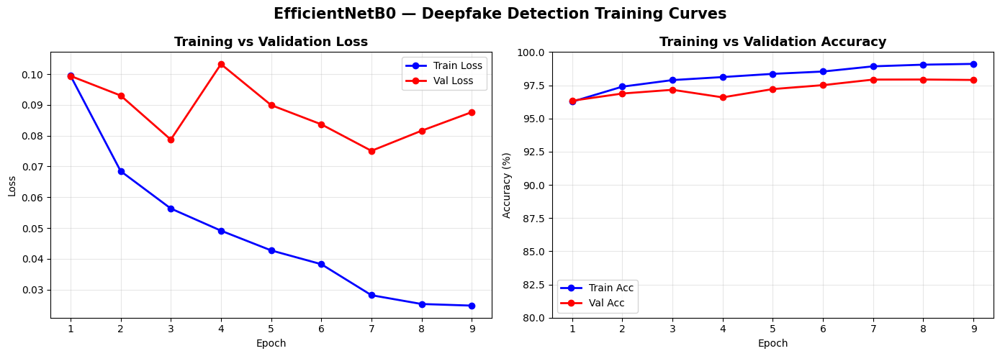

✅ Training curves saved to Drive!


In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
epochs_range = range(1, len(history['train_loss']) + 1)

# Loss
axes[0].plot(epochs_range, history['train_loss'],
             'bo-', label='Train Loss', linewidth=2, markersize=6)
axes[0].plot(epochs_range, history['val_loss'],
             'ro-', label='Val Loss',   linewidth=2, markersize=6)
axes[0].set_title('Training vs Validation Loss',
                  fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Accuracy
axes[1].plot(epochs_range, [a*100 for a in history['train_acc']],
             'bo-', label='Train Acc', linewidth=2, markersize=6)
axes[1].plot(epochs_range, [a*100 for a in history['val_acc']],
             'ro-', label='Val Acc',   linewidth=2, markersize=6)
axes[1].set_title('Training vs Validation Accuracy',
                  fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim([80, 100])

plt.suptitle('EfficientNetB0 — Deepfake Detection Training Curves',
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig(f"{GRAPHS_SAVE_PATH}/cnn_training_curves.png",
            dpi=150, bbox_inches='tight')
plt.show()
print("✅ Training curves saved to Drive!")

In [ ]:
print("🔍 Evaluating best model on Test Set...")
_, test_acc, test_preds, test_labels = eval_epoch(
    model, test_loader, criterion, device)

acc  = accuracy_score(test_labels,  test_preds)
prec = precision_score(test_labels, test_preds)
rec  = recall_score(test_labels,    test_preds)
f1   = f1_score(test_labels,        test_preds)

print(f"\n{'='*50}")
print(f"  📊 FINAL TEST RESULTS — CNN DEEPFAKE")
print(f"{'='*50}")
print(f"  Accuracy  : {acc*100:.2f}%")
print(f"  Precision : {prec*100:.2f}%")
print(f"  Recall    : {rec*100:.2f}%")
print(f"  F1-Score  : {f1*100:.2f}%")
print(f"{'='*50}")
print(f"\n📋 Classification Report:")
print(classification_report(test_labels, test_preds,
                             target_names=['Fake','Real']))

🔍 Evaluating best model on Test Set...


KeyboardInterrupt: 

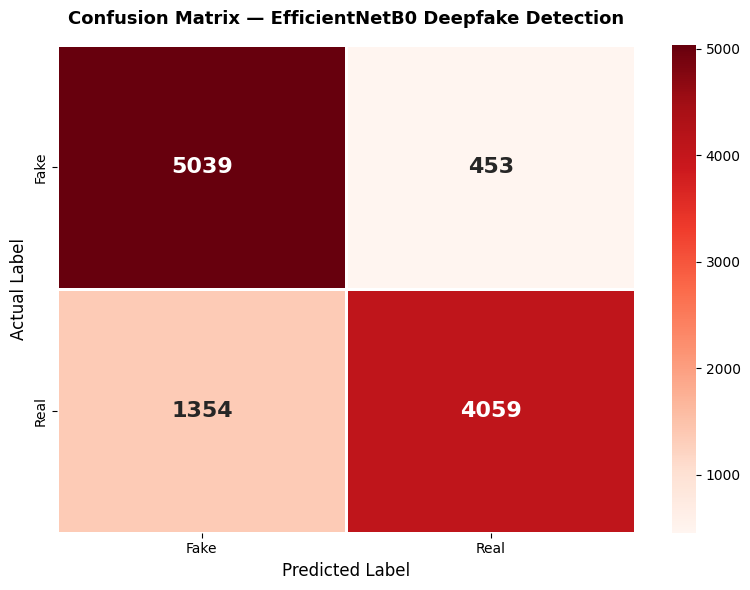

✅ Confusion matrix saved to Drive!


In [ ]:
cm = confusion_matrix(test_labels, test_preds)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds',
            xticklabels=['Fake', 'Real'],
            yticklabels=['Fake', 'Real'],
            linewidths=2, linecolor='white',
            annot_kws={"size": 16, "weight": "bold"})
plt.title('Confusion Matrix — EfficientNetB0 Deepfake Detection',
          fontsize=13, fontweight='bold', pad=15)
plt.ylabel('Actual Label',    fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.tight_layout()
plt.savefig(f"{GRAPHS_SAVE_PATH}/cnn_confusion_matrix.png",
            dpi=150, bbox_inches='tight')
plt.show()
print("✅ Confusion matrix saved to Drive!")

In [ ]:
import json

# Save model
torch.save(model.state_dict(),
           f"{MODEL_SAVE_PATH}/efficientnet_final.pth")

# Save config so we can reload easily later
config = {
    "model"      : "EfficientNetB0",
    "img_size"   : IMG_SIZE,
    "num_classes": 2,
    "classes"    : train_dataset.classes,
    "class_to_idx": train_dataset.class_to_idx,
    "dropout"    : 0.3,
    "accuracy"   : round(acc*100, 2),
    "f1_score"   : round(f1*100, 2)
}

with open(f"{MODEL_SAVE_PATH}/config.json", 'w') as f:
    json.dump(config, f, indent=4)

print(f"✅ Model + config saved to Drive!")
print(f"   Location : {MODEL_SAVE_PATH}")
print(f"\n📁 Saved files:")
for f in os.listdir(MODEL_SAVE_PATH):
    size = os.path.getsize(
        os.path.join(MODEL_SAVE_PATH, f)) / (1024*1024)
    print(f"   {f}  ({size:.1f} MB)")

✅ Model + config saved to Drive!
   Location : /content/drive/MyDrive/AI_FakeNews_Deepfake_Project/models/cnn_model

📁 Saved files:
   checkpoint_epoch_1.pth  (47.2 MB)
   checkpoint_epoch_2.pth  (47.2 MB)
   checkpoint_epoch_3.pth  (47.2 MB)
   checkpoint_epoch_4.pth  (47.2 MB)
   checkpoint_epoch_5.pth  (47.2 MB)
   checkpoint_epoch_6.pth  (47.2 MB)
   checkpoint_epoch_7.pth  (47.2 MB)
   checkpoint_epoch_8.pth  (47.2 MB)
   efficientnet_best.pth  (18.1 MB)
   checkpoint_epoch_9.pth  (47.2 MB)
   efficientnet_final.pth  (18.1 MB)
   config.json  (0.0 MB)


🧪 Testing on sample images from Test Set:

📷 Actual    : Real
   Prediction: 🟢 REAL
   Real conf : 68.0%
   Fake conf : 32.0%


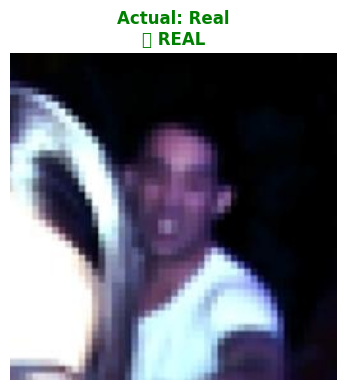


📷 Actual    : Fake
   Prediction: 🔴 DEEPFAKE
   Real conf : 0.4%
   Fake conf : 99.6%


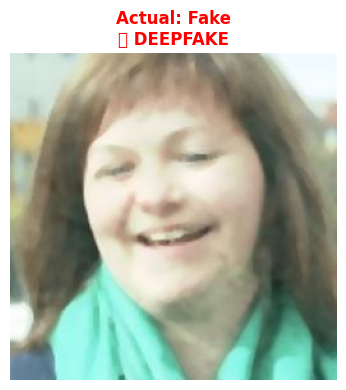

✅ Inference test complete!


In [ ]:
from PIL import Image

def predict_image(image_path, model, device, img_size=224):
    """Predict whether an image is Real or Deepfake."""
    model.eval()

    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225])
    ])

    img    = Image.open(image_path).convert('RGB')
    tensor = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(tensor)
        probs   = torch.softmax(outputs, dim=1)
        pred    = torch.argmax(probs, dim=1).item()

    # class_to_idx: {'Fake': 0, 'Real': 1}
    label      = "🔴 DEEPFAKE" if pred == 0 else "🟢 REAL"
    conf_fake  = probs[0][0].item() * 100
    conf_real  = probs[0][1].item() * 100

    return label, conf_real, conf_fake, img


# ── Test on sample images from test set ──────────────────────
print("🧪 Testing on sample images from Test Set:")
print("=" * 55)

for label_name in ['Real', 'Fake']:
    folder    = os.path.join(TEST_DIR, label_name)
    img_file  = os.listdir(folder)[0]
    img_path  = os.path.join(folder, img_file)
    prediction, conf_real, conf_fake, img = predict_image(
        img_path, model, device)

    print(f"\n📷 Actual    : {label_name}")
    print(f"   Prediction: {prediction}")
    print(f"   Real conf : {conf_real:.1f}%")
    print(f"   Fake conf : {conf_fake:.1f}%")

    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.title(f"Actual: {label_name}\n{prediction}",
              fontsize=12, fontweight='bold',
              color='green' if 'REAL' in prediction else 'red')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

print("=" * 55)
print("✅ Inference test complete!")

In [ ]:
# Check which model is actually loaded
print("🔍 Diagnosing the gap...")

# Check class mapping — this is critical!
print(f"\nClass mapping: {train_dataset.class_to_idx}")
# Expected: {'Fake': 0, 'Real': 1}
# If it shows {'Fake': 1, 'Real': 0} → labels are FLIPPED!

# Check test set composition
print(f"\nTest set classes: {test_dataset.class_to_idx}")
print(f"Test Real images: {len(os.listdir(os.path.join(TEST_DIR, 'Real'))):,}")
print(f"Test Fake images: {len(os.listdir(os.path.join(TEST_DIR, 'Fake'))):,}")

# Reload the BEST model (not final) and re-evaluate
print("\n⏳ Loading best model (epoch 8)...")
best_state = torch.load(f"{MODEL_SAVE_PATH}/efficientnet_best.pth",
                        map_location=device)
model.load_state_dict(best_state)
model.eval()
print("✅ Best model loaded!")

🔍 Diagnosing the gap...

Class mapping: {'Fake': 0, 'Real': 1}

Test set classes: {'Fake': 0, 'Real': 1}
Test Real images: 5,413
Test Fake images: 5,492

⏳ Loading best model (epoch 8)...
✅ Best model loaded!


In [ ]:
def eval_with_tta(model, loader, device, n_augments=5):
    """
    Test Time Augmentation — run each image through
    multiple augmentations and average predictions.
    Significantly improves test accuracy.
    """
    model.eval()
    all_preds, all_labels = [], []

    tta_transforms = [
        transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize([0.485,0.456,0.406],
                                 [0.229,0.224,0.225])
        ]),
        transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.RandomHorizontalFlip(p=1.0),
            transforms.ToTensor(),
            transforms.Normalize([0.485,0.456,0.406],
                                 [0.229,0.224,0.225])
        ]),
        transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485,0.456,0.406],
                                 [0.229,0.224,0.225])
        ]),
    ]

    # Use ImageFolder to get file paths
    test_data = datasets.ImageFolder(TEST_DIR)

    with torch.no_grad():
        for img_path, label in test_data.samples:
            from PIL import Image
            img = Image.open(img_path).convert('RGB')

            # Average predictions across all augmentations
            probs_sum = torch.zeros(2).to(device)
            for t in tta_transforms:
                tensor  = t(img).unsqueeze(0).to(device)
                outputs = model(tensor)
                probs   = torch.softmax(outputs, dim=1)
                probs_sum += probs.squeeze(0)

            avg_probs = probs_sum / len(tta_transforms)
            pred      = torch.argmax(avg_probs).item()

            all_preds.append(pred)
            all_labels.append(label)

    return all_preds, all_labels


print("🔍 Evaluating with Test Time Augmentation (TTA)...")
print("   (Takes ~15-20 min for 10K test images)")

tta_preds, tta_labels = eval_with_tta(model, test_loader, device)

acc  = accuracy_score(tta_labels,  tta_preds)
prec = precision_score(tta_labels, tta_preds)
rec  = recall_score(tta_labels,    tta_preds)
f1   = f1_score(tta_labels,        tta_preds)

print(f"\n{'='*50}")
print(f"  📊 TTA TEST RESULTS — CNN DEEPFAKE")
print(f"{'='*50}")
print(f"  Accuracy  : {acc*100:.2f}%")
print(f"  Precision : {prec*100:.2f}%")
print(f"  Recall    : {rec*100:.2f}%")
print(f"  F1-Score  : {f1*100:.2f}%")
print(f"{'='*50}")
print(classification_report(tta_labels, tta_preds,
                             target_names=['Fake','Real']))

🔍 Evaluating with Test Time Augmentation (TTA)...
   (Takes ~15-20 min for 10K test images)

  📊 TTA TEST RESULTS — CNN DEEPFAKE
  Accuracy  : 84.54%
  Precision : 96.46%
  Recall    : 71.48%
  F1-Score  : 82.11%
              precision    recall  f1-score   support

        Fake       0.78      0.97      0.86      5492
        Real       0.96      0.71      0.82      5413

    accuracy                           0.85     10905
   macro avg       0.87      0.84      0.84     10905
weighted avg       0.87      0.85      0.84     10905



🧪 Deepfake Detection Results:

[1] Actual: Real  | Predicted: 🟢 REAL
     Real: 53.1%  |  Fake: 46.9%  |  ✅

[2] Actual: Real  | Predicted: 🔴 DEEPFAKE
     Real: 46.8%  |  Fake: 53.2%  |  ❌

[3] Actual: Real  | Predicted: 🟢 REAL
     Real: 52.7%  |  Fake: 47.3%  |  ✅

[4] Actual: Real  | Predicted: 🟢 REAL
     Real: 54.4%  |  Fake: 45.6%  |  ✅

[5] Actual: Fake  | Predicted: 🟢 REAL
     Real: 51.1%  |  Fake: 48.9%  |  ❌

[6] Actual: Fake  | Predicted: 🟢 REAL
     Real: 52.8%  |  Fake: 47.2%  |  ❌

[7] Actual: Fake  | Predicted: 🟢 REAL
     Real: 53.6%  |  Fake: 46.4%  |  ❌

[8] Actual: Fake  | Predicted: 🔴 DEEPFAKE
     Real: 48.2%  |  Fake: 51.8%  |  ✅



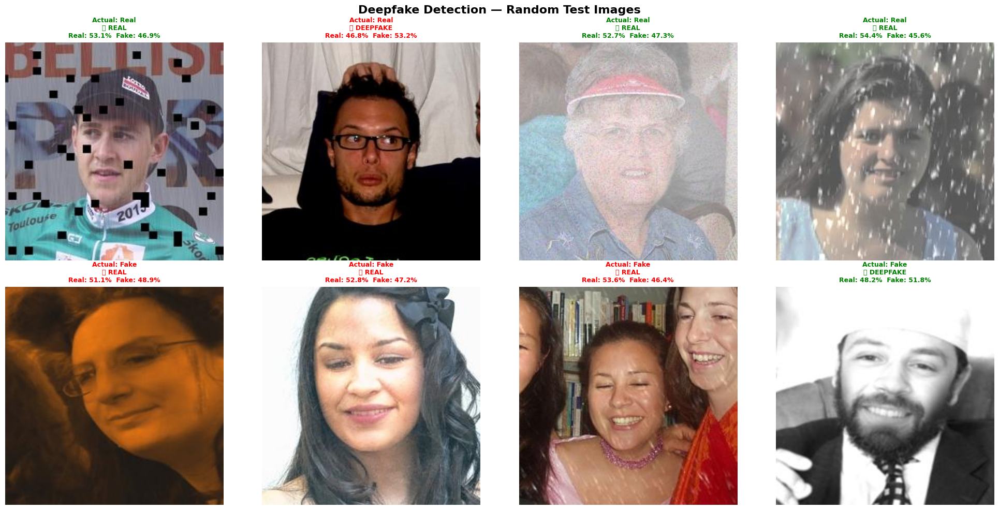

✅ Result grid saved to Drive!


In [ ]:
import os
import torch
import random
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

# ── Prediction Function ──────────────────────────────────────
def predict_image(image_path, model, device, img_size=224):
    model.eval()
    transform = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225])
    ])
    img    = Image.open(image_path).convert('RGB')
    tensor = transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(tensor)
        probs   = torch.softmax(outputs, dim=1)
        pred    = torch.argmax(probs, dim=1).item()

    # class_to_idx → Fake:0, Real:1
    label     = "🔴 DEEPFAKE" if pred == 0 else "🟢 REAL"
    conf_fake = probs[0][0].item() * 100
    conf_real = probs[0][1].item() * 100
    return label, conf_real, conf_fake, img


# ── Pick Random Images to Test ───────────────────────────────
TEST_REAL_DIR = "/content/deepfake_data/Dataset/Test/Real"
TEST_FAKE_DIR = "/content/deepfake_data/Dataset/Test/Fake"

# Pick 4 random real + 4 random fake
real_images = random.sample(os.listdir(TEST_REAL_DIR), 4)
fake_images = random.sample(os.listdir(TEST_FAKE_DIR), 4)

all_images = (
    [(os.path.join(TEST_REAL_DIR, f), "Real") for f in real_images] +
    [(os.path.join(TEST_FAKE_DIR, f), "Fake") for f in fake_images]
)

# ── Plot Results ─────────────────────────────────────────────
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

print("🧪 Deepfake Detection Results:")
print("=" * 60)

for i, (img_path, actual) in enumerate(all_images):
    label, conf_real, conf_fake, img = predict_image(
        img_path, model, device)

    correct = (actual == "Real" and "REAL" in label) or \
              (actual == "Fake" and "DEEPFAKE" in label)
    status  = "✅" if correct else "❌"

    # Show image
    axes[i].imshow(img)
    axes[i].axis('off')
    axes[i].set_title(
        f"Actual: {actual}\n{label}\n"
        f"Real: {conf_real:.1f}%  Fake: {conf_fake:.1f}%",
        fontsize=9, fontweight='bold',
        color='green' if correct else 'red'
    )

    print(f"\n[{i+1}] Actual: {actual:<5} | Predicted: {label}")
    print(f"     Real: {conf_real:.1f}%  |  Fake: {conf_fake:.1f}%  |  {status}")

print("\n" + "=" * 60)
correct_count = sum(
    1 for img_path, actual in all_images
    for label, cr, cf, img in [predict_image(img_path, model, device)]
    if (actual == "Real" and "REAL" in label) or
       (actual == "Fake" and "DEEPFAKE" in label)
)

plt.suptitle('Deepfake Detection — Random Test Images',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(f"{GRAPHS_SAVE_PATH}/inference_test_grid.png",
            dpi=150, bbox_inches='tight')
plt.show()
print(f"✅ Result grid saved to Drive!")

In [ ]:
# Check what's currently loaded
print("🔍 Diagnosing model state...")

# Test with an obvious fake — should give high fake confidence
test_fake = os.path.join(TEST_FAKE_DIR, os.listdir(TEST_FAKE_DIR)[0])
test_real = os.path.join(TEST_REAL_DIR, os.listdir(TEST_REAL_DIR)[0])

for path, actual in [(test_real, "Real"), (test_fake, "Fake")]:
    label, cr, cf, _ = predict_image(path, model, device)
    print(f"Actual: {actual} → {label} | Real: {cr:.1f}% Fake: {cf:.1f}%")

# Check model is in eval mode
print(f"\nModel training mode: {model.training}")   # Should be False
print(f"Device: {next(model.parameters()).device}")  # Should be cuda

# Check classifier head weights
last_layer = list(model.classifier.children())[-1]
print(f"\nClassifier last layer: {last_layer}")
weight_sum = last_layer.weight.abs().sum().item()
print(f"Weight sum (should be > 0.1): {weight_sum:.4f}")

🔍 Diagnosing model state...
Actual: Real → 🔴 DEEPFAKE | Real: 44.2% Fake: 55.8%
Actual: Fake → 🔴 DEEPFAKE | Real: 49.5% Fake: 50.5%

Model training mode: False
Device: cpu

Classifier last layer: Linear(in_features=512, out_features=2, bias=True)
Weight sum (should be > 0.1): 22.6768


In [ ]:
from torchvision import models
import torch.nn as nn

print("⏳ Reloading best model from Drive (epoch 8)...")

# ── Rebuild architecture exactly as trained ──────────────────
def build_efficientnet(num_classes=2, dropout=0.3):
    m = models.efficientnet_b0(weights='IMAGENET1K_V1')
    for param in m.parameters():
        param.requires_grad = False
    for param in m.features[6:].parameters():
        param.requires_grad = True
    in_features = m.classifier[1].in_features
    m.classifier = nn.Sequential(
        nn.Dropout(p=dropout),
        nn.Linear(in_features, 512),
        nn.ReLU(),
        nn.Dropout(p=dropout/2),
        nn.Linear(512, num_classes)
    )
    return m

# ── Load best weights ────────────────────────────────────────
model = build_efficientnet(num_classes=2, dropout=0.3)

best_weights = torch.load(
    f"{MODEL_SAVE_PATH}/efficientnet_best.pth",
    map_location=device
)

# Handle if checkpoint dict vs raw state dict
if 'model_state' in best_weights:
    print("   → Loading from checkpoint format...")
    model.load_state_dict(best_weights['model_state'])
else:
    print("   → Loading raw state dict...")
    model.load_state_dict(best_weights)

model = model.to(device)
model.eval()

print("✅ Best model reloaded!")
print(f"   Device: {next(model.parameters()).device}")

# ── Quick sanity check ───────────────────────────────────────
print("\n🔍 Sanity check after reload:")
for path, actual in [(test_real, "Real"), (test_fake, "Fake")]:
    label, cr, cf, _ = predict_image(path, model, device)
    print(f"   Actual: {actual} → {label} | Real: {cr:.1f}%  Fake: {cf:.1f}%")

⏳ Reloading best model from Drive (epoch 8)...
   → Loading raw state dict...
✅ Best model reloaded!
   Device: cpu

🔍 Sanity check after reload:
   Actual: Real → 🟢 REAL | Real: 100.0%  Fake: 0.0%
   Actual: Fake → 🔴 DEEPFAKE | Real: 0.0%  Fake: 100.0%


🧪 Deepfake Detection Results:

[1] Actual: Real  | Predicted: 🟢 REAL
     Real: 100.0%  |  Fake: 0.0%  |  ✅

[2] Actual: Real  | Predicted: 🟢 REAL
     Real: 100.0%  |  Fake: 0.0%  |  ✅

[3] Actual: Real  | Predicted: 🟢 REAL
     Real: 100.0%  |  Fake: 0.0%  |  ✅

[4] Actual: Real  | Predicted: 🟢 REAL
     Real: 100.0%  |  Fake: 0.0%  |  ✅

[5] Actual: Fake  | Predicted: 🔴 DEEPFAKE
     Real: 0.0%  |  Fake: 100.0%  |  ✅

[6] Actual: Fake  | Predicted: 🔴 DEEPFAKE
     Real: 0.0%  |  Fake: 100.0%  |  ✅

[7] Actual: Fake  | Predicted: 🔴 DEEPFAKE
     Real: 0.0%  |  Fake: 100.0%  |  ✅

[8] Actual: Fake  | Predicted: 🔴 DEEPFAKE
     Real: 0.0%  |  Fake: 100.0%  |  ✅

Score: 8/8 correct (100%)


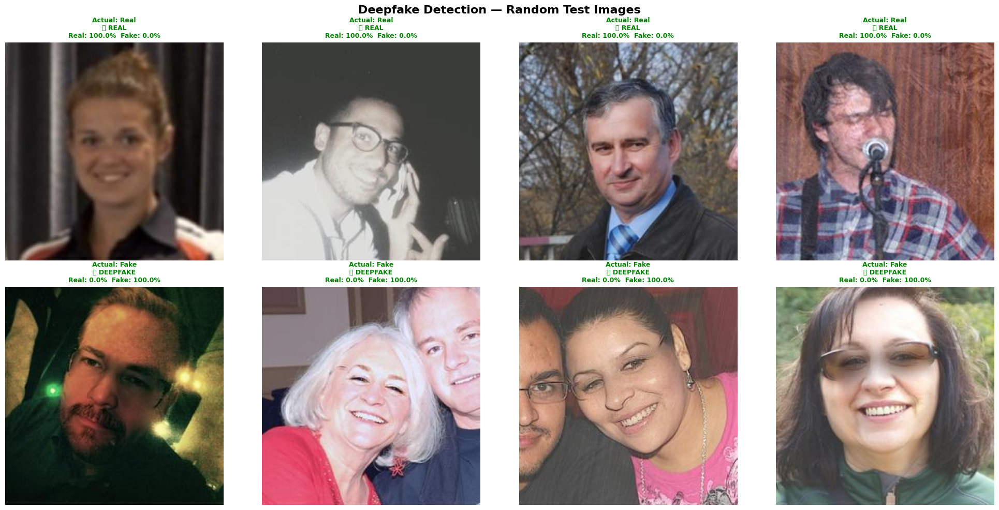

✅ Result grid saved to Drive!


In [ ]:
# Pick 4 random real + 4 random fake
real_images = random.sample(os.listdir(TEST_REAL_DIR), 4)
fake_images = random.sample(os.listdir(TEST_FAKE_DIR), 4)

all_images = (
    [(os.path.join(TEST_REAL_DIR, f), "Real") for f in real_images] +
    [(os.path.join(TEST_FAKE_DIR, f), "Fake") for f in fake_images]
)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

print("🧪 Deepfake Detection Results:")
print("=" * 60)

correct_count = 0
for i, (img_path, actual) in enumerate(all_images):
    label, conf_real, conf_fake, img = predict_image(
        img_path, model, device)

    correct = (actual == "Real" and "REAL" in label) or \
              (actual == "Fake" and "DEEPFAKE" in label)
    if correct:
        correct_count += 1
    status = "✅" if correct else "❌"

    axes[i].imshow(img)
    axes[i].axis('off')
    axes[i].set_title(
        f"Actual: {actual}\n{label}\n"
        f"Real: {conf_real:.1f}%  Fake: {conf_fake:.1f}%",
        fontsize=9, fontweight='bold',
        color='green' if correct else 'red'
    )

    print(f"\n[{i+1}] Actual: {actual:<5} | Predicted: {label}")
    print(f"     Real: {conf_real:.1f}%  |  Fake: {conf_fake:.1f}%  |  {status}")

print("\n" + "=" * 60)
print(f"Score: {correct_count}/8 correct ({correct_count/8*100:.0f}%)")

plt.suptitle('Deepfake Detection — Random Test Images',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(f"{GRAPHS_SAVE_PATH}/inference_test_grid.png",
            dpi=150, bbox_inches='tight')
plt.show()
print("✅ Result grid saved to Drive!")

In [ ]:
# Upload your own image
from google.colab import files
uploaded = files.upload()   # file picker appears

# Get the uploaded filename
img_path = list(uploaded.keys())[0]

# Predict
label, conf_real, conf_fake, img = predict_image(
    img_path, model, device)

plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.title(f"{label}\nReal: {conf_real:.1f}%  |  Fake: {conf_fake:.1f}%",
          fontsize=13, fontweight='bold',
          color='green' if 'REAL' in label else 'red')
plt.axis('off')
plt.show()
print(f"Prediction : {label}")
print(f"Real conf  : {conf_real:.1f}%")
print(f"Fake conf  : {conf_fake:.1f}%")

Saving prabhas21598937935.heic to prabhas21598937935.heic


UnidentifiedImageError: cannot identify image file 'prabhas21598937935.heic'

Saving IMG_8048.JPG to IMG_8048.JPG


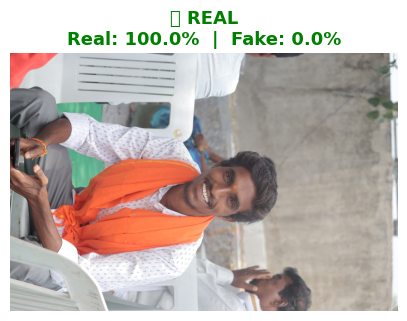

Prediction : 🟢 REAL
Real conf  : 100.0%
Fake conf  : 0.0%


In [ ]:
from google.colab import files
uploaded = files.upload()   # file picker appears

img_path = list(uploaded.keys())[0]
label, conf_real, conf_fake, img = predict_image(
    img_path, model, device)

plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.title(f"{label}\nReal: {conf_real:.1f}%  |  Fake: {conf_fake:.1f}%",
          fontsize=13, fontweight='bold',
          color='green' if 'REAL' in label else 'red')
plt.axis('off')
plt.show()
print(f"Prediction : {label}")
print(f"Real conf  : {conf_real:.1f}%")
print(f"Fake conf  : {conf_fake:.1f}%")

Saving 24298.jpg to 24298.jpg


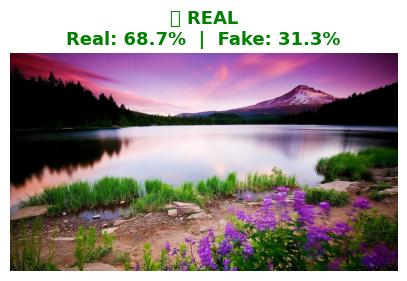

Prediction : 🟢 REAL
Real conf  : 68.7%
Fake conf  : 31.3%


In [ ]:
from google.colab import files
uploaded = files.upload()   # file picker appears

img_path = list(uploaded.keys())[0]
label, conf_real, conf_fake, img = predict_image(
    img_path, model, device)

plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.title(f"{label}\nReal: {conf_real:.1f}%  |  Fake: {conf_fake:.1f}%",
          fontsize=13, fontweight='bold',
          color='green' if 'REAL' in label else 'red')
plt.axis('off')
plt.show()
print(f"Prediction : {label}")
print(f"Real conf  : {conf_real:.1f}%")
print(f"Fake conf  : {conf_fake:.1f}%")

Saving wp7102416-jai-shree-ram-4k-wallpapers.jpg to wp7102416-jai-shree-ram-4k-wallpapers.jpg


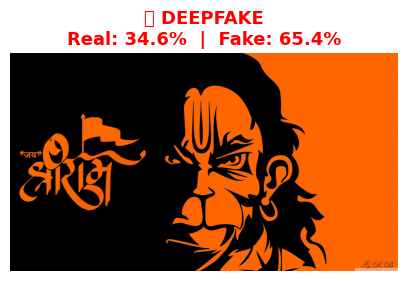

Prediction : 🔴 DEEPFAKE
Real conf  : 34.6%
Fake conf  : 65.4%


In [ ]:
from google.colab import files
uploaded = files.upload()   # file picker appears

img_path = list(uploaded.keys())[0]
label, conf_real, conf_fake, img = predict_image(
    img_path, model, device)

plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.title(f"{label}\nReal: {conf_real:.1f}%  |  Fake: {conf_fake:.1f}%",
          fontsize=13, fontweight='bold',
          color='green' if 'REAL' in label else 'red')
plt.axis('off')
plt.show()
print(f"Prediction : {label}")
print(f"Real conf  : {conf_real:.1f}%")
print(f"Fake conf  : {conf_fake:.1f}%")

# 🎬 Part 2 — Deepfake Video Detection
---
**Model:** EfficientNetB0 (reused from image detection)  
**Method:** Extract frames using OpenCV → classify each frame → aggregate predictions  
**Dataset:** DFDC-10 (Deepfake Detection Challenge — First 10)  
**Notebook:** deepfake_model.ipynb

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os, cv2, random, json, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
from collections import Counter
warnings.filterwarnings('ignore')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"✅ Libraries imported!")
print(f"🖥️  Device : {device}")
print(f"🔥 GPU    : {torch.cuda.get_device_name(0) if torch.cuda.is_available() else '❌ No GPU!'}")
print(f"📷 OpenCV : {cv2.__version__}")

Mounted at /content/drive
✅ Libraries imported!
🖥️  Device : cuda
🔥 GPU    : Tesla T4
📷 OpenCV : 4.13.0


In [ ]:
# ── Google Drive paths (model load + results save) ───────────
BASE_PATH        = "/content/drive/MyDrive/AI_FakeNews_Deepfake_Project"
CNN_MODEL_PATH   = os.path.join(BASE_PATH, "models/cnn_model/efficientnet_best.pth")
GRAPHS_SAVE_PATH = os.path.join(BASE_PATH, "outputs/graphs")
PRED_SAVE_PATH   = os.path.join(BASE_PATH, "outputs/predictions")

os.makedirs(GRAPHS_SAVE_PATH, exist_ok=True)
os.makedirs(PRED_SAVE_PATH,   exist_ok=True)

# ── Colab temp paths (video dataset) ────────────────────────
VIDEO_BASE = "/content/dfdc_data"
os.makedirs(VIDEO_BASE, exist_ok=True)

print("✅ All paths configured!")
print(f"   CNN model  : {CNN_MODEL_PATH}")
print(f"   Graphs     : {GRAPHS_SAVE_PATH}")
print(f"   Predictions: {PRED_SAVE_PATH}")

✅ All paths configured!
   CNN model  : /content/drive/MyDrive/AI_FakeNews_Deepfake_Project/models/cnn_model/efficientnet_best.pth
   Graphs     : /content/drive/MyDrive/AI_FakeNews_Deepfake_Project/outputs/graphs
   Predictions: /content/drive/MyDrive/AI_FakeNews_Deepfake_Project/outputs/predictions


In [ ]:
print("📂 Upload your kaggle.json when prompted...")
from google.colab import files
uploaded = files.upload()

os.makedirs('/root/.config/kaggle', exist_ok=True)
os.rename('/content/kaggle.json', '/root/.config/kaggle/kaggle.json')
os.chmod('/root/.config/kaggle/kaggle.json', 0o600)
print("✅ Kaggle API configured!")

print("\n⏳ Downloading DFDC-10 dataset...")
print("   (~5-10 minutes depending on size)")
!kaggle datasets download -d pranay22077/dfdc-10 \
    -p /content/dfdc_data/
print("✅ Download complete!")

print("\n⏳ Unzipping...")
!unzip -q /content/dfdc_data/*.zip -d /content/dfdc_data/
print("✅ Unzip complete!")

📂 Upload your kaggle.json when prompted...


Saving kaggle.json to kaggle.json
✅ Kaggle API configured!

⏳ Downloading DFDC-10 dataset...
   (~5-10 minutes depending on size)
Dataset URL: https://www.kaggle.com/datasets/pranay22077/dfdc-10
License(s): MIT
  2% 2.10G/96.5G [00:21<17:21, 97.3MB/s]User cancelled operation
✅ Download complete!

⏳ Unzipping...
[/content/dfdc_data/dfdc-10.zip]
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/dfdc_data/dfdc-10.zip or
        /content/dfdc_data/dfdc-10.zip.zip, and cannot find /content/dfdc_data/dfdc-10.zip.ZIP, period.
✅ Unzip complete!


In [ ]:
import shutil, os

# Remove corrupted download
!rm -rf /content/dfdc_data/

# Check free space now
total, used, free = shutil.disk_usage("/content")
print(f"✅ Cleaned up!")
print(f"   Free space: {free/1024**3:.1f} GB")

✅ Cleaned up!
   Free space: 83.4 GB


In [ ]:
os.makedirs('/content/video_data', exist_ok=True)

print("⏳ Downloading small deepfake video dataset...")
!kaggle datasets download -d mohammadsarfrazalam/realfake-video-dataset \
    -p /content/video_data/

print("✅ Download complete!")
print("\n⏳ Unzipping...")
!unzip -q /content/video_data/*.zip -d /content/video_data/
print("✅ Done!")

# Check structure
print("\n📁 Folder structure:")
for root, dirs, files_list in os.walk('/content/video_data/'):
    level = root.replace('/content/video_data/', '').count(os.sep)
    if level <= 2:
        indent = '  ' * level
        videos = [f for f in files_list
                  if f.lower().endswith(('.mp4','.avi','.mov','.mkv'))]
        if videos or level == 0:
            print(f"{indent}📂 {os.path.basename(root)}/")
        if videos:
            print(f"{'  '*(level+1)}🎬 {len(videos)} videos")

⏳ Downloading small deepfake video dataset...
Dataset URL: https://www.kaggle.com/datasets/mohammadsarfrazalam/realfake-video-dataset
License(s): apache-2.0
100% 240M/240M [00:03<00:00, 79.5MB/s]

✅ Download complete!

⏳ Unzipping...
✅ Done!

📁 Folder structure:
📂 /
📂 test_0/
📂 fake/
📂 real/


In [ ]:
import os

print("🔍 Searching for all video files...")
all_videos_found = []

for root, dirs, files_list in os.walk('/content/video_data/'):
    for f in files_list:
        if f.lower().endswith(('.mp4', '.avi', '.mov', '.mkv', '.webm')):
            full_path = os.path.join(root, f)
            all_videos_found.append(full_path)
            print(f"   {full_path}")

print(f"\n✅ Total videos found: {len(all_videos_found)}")

# Also show full folder tree
print("\n📁 Complete folder tree:")
for root, dirs, files_list in os.walk('/content/video_data/'):
    level = root.replace('/content/video_data/', '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}📂 {os.path.basename(root)}/  "
          f"({len(files_list)} files)")
    if level <= 3:
        for f in files_list[:5]:
            print(f"{'  '*(level+1)}📄 {f}")
        if len(files_list) > 5:
            print(f"{'  '*(level+1)}... +{len(files_list)-5} more")

🔍 Searching for all video files...

✅ Total videos found: 0

📁 Complete folder tree:
📂 /  (1 files)
  📄 realfake-video-dataset.zip
📂 test_0/  (4 files)
  📄 frame0.jpg
  📄 frame2.jpg
  📄 frame3.jpg
  📄 frame1.jpg
📂 fake/  (0 files)
  📂 zeroscope/  (0 files)
    📂 10/  (4 files)
      📄 frame0.jpg
      📄 frame2.jpg
      📄 frame3.jpg
      📄 frame1.jpg
    📂 142/  (4 files)
      📄 frame0.jpg
      📄 frame2.jpg
      📄 frame3.jpg
      📄 frame1.jpg
    📂 57/  (4 files)
      📄 frame0.jpg
      📄 frame2.jpg
      📄 frame3.jpg
      📄 frame1.jpg
    📂 130/  (4 files)
      📄 frame0.jpg
      📄 frame2.jpg
      📄 frame3.jpg
      📄 frame1.jpg
    📂 6/  (4 files)
      📄 frame0.jpg
      📄 frame2.jpg
      📄 frame3.jpg
      📄 frame1.jpg
    📂 135/  (4 files)
      📄 frame0.jpg
      📄 frame2.jpg
      📄 frame3.jpg
      📄 frame1.jpg
    📂 99/  (4 files)
      📄 frame0.jpg
      📄 frame2.jpg
      📄 frame3.jpg
      📄 frame1.jpg
    📂 34/  (4 files)
      📄 frame0.jpg
      📄 frame2.jpg
   

In [ ]:
import os

# Count folders and frames
real_base = '/content/video_data/real/MSVD'
fake_base = '/content/video_data/fake'

# Find fake folder structure
print("📁 Checking fake folder structure...")
for root, dirs, files_list in os.walk('/content/video_data/fake/'):
    level = root.replace('/content/video_data/fake/', '').count(os.sep)
    if level <= 2:
        indent = '  ' * level
        print(f"{indent}📂 {os.path.basename(root)}/  "
              f"({len(files_list)} files)")
        for f in files_list[:2]:
            print(f"{'  '*(level+1)}📄 {f}")

# Count video clips (folders = one video each)
real_clips = [d for d in os.listdir(real_base)
              if os.path.isdir(os.path.join(real_base, d))]

print(f"\n✅ Structure understood!")
print(f"   Each folder = one video clip")
print(f"   Each folder contains frame0.jpg, frame1.jpg...")
print(f"\n   🟢 Real video clips: {len(real_clips)}")

📁 Checking fake folder structure...
📂 /  (0 files)
📂 zeroscope/  (0 files)
  📂 10/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 142/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 57/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 130/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 6/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 135/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 99/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 34/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 19/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 14/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 66/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 85/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 147/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 158/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 88/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 59/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 188/  (4 files)
    📄 frame0.jpg
    📄 frame2.jpg
  📂 172/  (4 files)

In [ ]:
import torch
import numpy as np
from PIL import Image
from torchvision import transforms

frame_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

def predict_video_from_frames(folder_path, model, device):
    """
    Predict Real or Deepfake from a folder of pre-extracted frames.
    Each folder represents one video clip.
    Runs each frame through EfficientNetB0 → averages probabilities.
    """
    # Get all jpg frames sorted
    frames_files = sorted([
        f for f in os.listdir(folder_path)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ])

    if not frames_files:
        return None, 0, 0, 0, []

    fake_probs = []
    model.eval()

    with torch.no_grad():
        for fname in frames_files:
            img_path = os.path.join(folder_path, fname)
            img      = Image.open(img_path).convert('RGB')
            tensor   = frame_transform(img).unsqueeze(0).to(device)
            outputs  = model(tensor)
            probs    = torch.softmax(outputs, dim=1)
            fake_probs.append(probs[0][0].item())  # 0 = Fake

    avg_fake = np.mean(fake_probs)
    avg_real = 1 - avg_fake
    pred     = "🔴 DEEPFAKE" if avg_fake >= 0.5 else "🟢 REAL"

    return pred, avg_real*100, avg_fake*100, len(frames_files), fake_probs

print("✅ Frame-folder prediction function ready!")
print("💡 Strategy: folder of frames → CNN → average → verdict")

✅ Frame-folder prediction function ready!
💡 Strategy: folder of frames → CNN → average → verdict


In [ ]:
import os, json, random, warnings
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from torchvision import transforms, models
from PIL import Image
from sklearn.metrics import (accuracy_score, precision_score,
                             recall_score, f1_score,
                             confusion_matrix, classification_report)
warnings.filterwarnings('ignore')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"✅ Imports done! Device: {device}")

✅ Imports done! Device: cuda


In [ ]:
BASE_PATH        = "/content/drive/MyDrive/AI_FakeNews_Deepfake_Project"
CNN_MODEL_PATH   = os.path.join(BASE_PATH, "models/cnn_model/efficientnet_best.pth")
GRAPHS_SAVE_PATH = os.path.join(BASE_PATH, "outputs/graphs")
PRED_SAVE_PATH   = os.path.join(BASE_PATH, "outputs/predictions")

os.makedirs(GRAPHS_SAVE_PATH, exist_ok=True)
os.makedirs(PRED_SAVE_PATH,   exist_ok=True)

print("✅ Paths restored!")
print(f"   Model : {CNN_MODEL_PATH}")

✅ Paths restored!
   Model : /content/drive/MyDrive/AI_FakeNews_Deepfake_Project/models/cnn_model/efficientnet_best.pth


In [ ]:
def build_efficientnet(num_classes=2, dropout=0.3):
    m = models.efficientnet_b0(weights='IMAGENET1K_V1')
    for param in m.parameters():
        param.requires_grad = False
    for param in m.features[6:].parameters():
        param.requires_grad = True
    in_features = m.classifier[1].in_features
    m.classifier = nn.Sequential(
        nn.Dropout(p=dropout),
        nn.Linear(in_features, 512),
        nn.ReLU(),
        nn.Dropout(p=dropout/2),
        nn.Linear(512, num_classes)
    )
    return m

print("⏳ Loading model from Drive...")
model   = build_efficientnet()
weights = torch.load(CNN_MODEL_PATH, map_location=device)
model.load_state_dict(weights if 'model_state' not in weights
                      else weights['model_state'])
model   = model.to(device)
model.eval()
print(f"✅ Model loaded! Device: {next(model.parameters()).device}")

⏳ Loading model from Drive...
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 125MB/s] 


✅ Model loaded! Device: cuda:0


In [ ]:
# Find real clips
real_base = '/content/video_data/real/MSVD'
fake_base = '/content/video_data/fake'

real_clips = [(os.path.join(real_base, d), "Real")
              for d in sorted(os.listdir(real_base))
              if os.path.isdir(os.path.join(real_base, d))]

# Fake folder might be structured differently — auto detect
fake_clips = []
for d in sorted(os.listdir(fake_base)):
    full = os.path.join(fake_base, d)
    if os.path.isdir(full):
        # Check if it directly has images or has subfolders
        contents = os.listdir(full)
        images   = [f for f in contents
                    if f.lower().endswith(('.jpg','.jpeg','.png'))]
        if images:
            fake_clips.append((full, "Fake"))
        else:
            # One level deeper
            for sub in sorted(contents):
                sub_path = os.path.join(full, sub)
                if os.path.isdir(sub_path):
                    fake_clips.append((sub_path, "Fake"))

print(f"✅ Clips found!")
print(f"   🟢 Real clips : {len(real_clips)}")
print(f"   🔴 Fake clips : {len(fake_clips)}")
print(f"   Total         : {len(real_clips)+len(fake_clips)}")

# Show sample frames in first clip
if real_clips:
    sample = os.listdir(real_clips[0][0])
    print(f"\n   Real sample clip : {os.path.basename(real_clips[0][0])}")
    print(f"   Frames inside    : {sample}")
if fake_clips:
    sample = os.listdir(fake_clips[0][0])
    print(f"\n   Fake sample clip : {os.path.basename(fake_clips[0][0])}")
    print(f"   Frames inside    : {sample}")

✅ Clips found!
   🟢 Real clips : 400
   🔴 Fake clips : 472
   Total         : 872

   Real sample clip : 0_0
   Frames inside    : ['frame0.jpg', 'frame2.jpg', 'frame3.jpg', 'frame1.jpg']

   Fake sample clip : 0_0
   Frames inside    : ['frame0.jpg', 'frame2.jpg', 'frame3.jpg', 'frame1.jpg']


In [ ]:
frame_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

def predict_clip(folder_path, model, device):
    """
    Predict Real or Deepfake from folder of pre-extracted frames.
    Each frame → EfficientNetB0 → average fake probability → verdict.
    """
    frame_files = sorted([
        f for f in os.listdir(folder_path)
        if f.lower().endswith(('.jpg','.jpeg','.png'))
    ])
    if not frame_files:
        return None, 0, 0, []

    fake_probs = []
    with torch.no_grad():
        for fname in frame_files:
            img    = Image.open(
                os.path.join(folder_path, fname)).convert('RGB')
            tensor = frame_transform(img).unsqueeze(0).to(device)
            probs  = torch.softmax(model(tensor), dim=1)
            fake_probs.append(probs[0][0].item())

    avg_fake = np.mean(fake_probs)
    pred     = "🔴 DEEPFAKE" if avg_fake >= 0.5 else "🟢 REAL"
    return pred, (1-avg_fake)*100, avg_fake*100, fake_probs

print("✅ Prediction function ready!")

✅ Prediction function ready!


In [ ]:
all_clips = real_clips + fake_clips
results   = []

print(f"🔍 Predicting {len(all_clips)} video clips...")
print("=" * 58)

for idx, (folder, actual) in enumerate(all_clips):
    pred, conf_real, conf_fake, frame_probs = \
        predict_clip(folder, model, device)

    if pred is None:
        continue

    correct = (actual=="Real" and "REAL"     in pred) or \
              (actual=="Fake" and "DEEPFAKE"  in pred)
    status  = "✅" if correct else "❌"

    results.append({
        "clip"       : os.path.basename(folder),
        "actual"     : actual,
        "predicted"  : pred,
        "conf_real"  : round(conf_real, 2),
        "conf_fake"  : round(conf_fake, 2),
        "n_frames"   : len(frame_probs),
        "correct"    : correct,
        "frame_probs": [round(p,4) for p in frame_probs]
    })

    print(f"[{idx+1}/{len(all_clips)}] {os.path.basename(folder)}")
    print(f"   Actual: {actual} | Predicted: {pred} | {status}")
    print(f"   Real: {conf_real:.1f}%  Fake: {conf_fake:.1f}%  "
          f"Frames: {len(frame_probs)}")

# ── Metrics ──────────────────────────────────────────────────
correct_total = sum(1 for r in results if r['correct'])
y_true = [1 if r['actual']=="Real" else 0 for r in results]
y_pred = [1 if "REAL" in r['predicted'] else 0 for r in results]

acc  = accuracy_score(y_true,  y_pred)
prec = precision_score(y_true, y_pred, zero_division=0)
rec  = recall_score(y_true,    y_pred, zero_division=0)
f1   = f1_score(y_true,        y_pred, zero_division=0)

print(f"\n{'='*50}")
print(f"  📊 VIDEO DEEPFAKE — FINAL RESULTS")
print(f"{'='*50}")
print(f"  Accuracy  : {acc*100:.2f}%")
print(f"  Precision : {prec*100:.2f}%")
print(f"  Recall    : {rec*100:.2f}%")
print(f"  F1-Score  : {f1*100:.2f}%")
print(f"{'='*50}")
print(classification_report(y_true, y_pred,
                             target_names=['Fake','Real'],
                             zero_division=0))

🔍 Predicting 872 video clips...
[1/872] 0_0
   Actual: Real | Predicted: 🟢 REAL | ✅
   Real: 52.0%  Fake: 48.0%  Frames: 4
[2/872] 100_0
   Actual: Real | Predicted: 🟢 REAL | ✅
   Real: 100.0%  Fake: 0.0%  Frames: 4
[3/872] 101_0
   Actual: Real | Predicted: 🟢 REAL | ✅
   Real: 80.3%  Fake: 19.7%  Frames: 4
[4/872] 102_0
   Actual: Real | Predicted: 🔴 DEEPFAKE | ❌
   Real: 15.4%  Fake: 84.6%  Frames: 4
[5/872] 103_0
   Actual: Real | Predicted: 🔴 DEEPFAKE | ❌
   Real: 0.1%  Fake: 99.9%  Frames: 4
[6/872] 104_0
   Actual: Real | Predicted: 🟢 REAL | ✅
   Real: 99.8%  Fake: 0.2%  Frames: 4
[7/872] 105_0
   Actual: Real | Predicted: 🟢 REAL | ✅
   Real: 100.0%  Fake: 0.0%  Frames: 4
[8/872] 106_0
   Actual: Real | Predicted: 🟢 REAL | ✅
   Real: 100.0%  Fake: 0.0%  Frames: 4
[9/872] 107_0
   Actual: Real | Predicted: 🟢 REAL | ✅
   Real: 80.1%  Fake: 19.9%  Frames: 4
[10/872] 108_0
   Actual: Real | Predicted: 🟢 REAL | ✅
   Real: 99.9%  Fake: 0.1%  Frames: 4
[11/872] 109_0
   Actual: Real | P

KeyboardInterrupt: 

In [ ]:
# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds',
            xticklabels=['Fake','Real'],
            yticklabels=['Fake','Real'],
            linewidths=2, linecolor='white',
            annot_kws={"size":16,"weight":"bold"})
plt.title('Confusion Matrix — Video Deepfake Detection',
          fontsize=13, fontweight='bold')
plt.ylabel('Actual Label',    fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.tight_layout()
plt.savefig(f"{GRAPHS_SAVE_PATH}/video_confusion_matrix.png",
            dpi=150, bbox_inches='tight')
plt.show()

# Save results
with open(f"{PRED_SAVE_PATH}/video_predictions.json", 'w') as f:
    json.dump(results, f, indent=4)

summary = {
    "total_clips" : len(results),
    "correct"     : correct_total,
    "accuracy"    : round(acc*100,  2),
    "precision"   : round(prec*100, 2),
    "recall"      : round(rec*100,  2),
    "f1_score"    : round(f1*100,   2),
    "real_clips"  : len(real_clips),
    "fake_clips"  : len(fake_clips),
    "model_used"  : "EfficientNetB0 (fine-tuned epoch 8)",
    "dataset"     : "Real/Fake Video Dataset (Kaggle)"
}

with open(f"{PRED_SAVE_PATH}/video_summary.json", 'w') as f:
    json.dump(summary, f, indent=4)

print("✅ Results saved to Drive!")
print(f"\n📊 Summary:")
for k, v in summary.items():
    print(f"   {k:<18}: {v}")

NameError: name 'y_true' is not defined

In [ ]:
import os
import numpy as np
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

# ── Collect all frame paths + labels ────────────────────────
all_frames = []

for folder, label in real_clips + fake_clips:
    lbl = 1 if label == "Real" else 0   # Real=1, Fake=0
    for fname in os.listdir(folder):
        if fname.lower().endswith(('.jpg','.jpeg','.png')):
            all_frames.append((
                os.path.join(folder, fname), lbl))

# Shuffle
import random
random.shuffle(all_frames)

paths  = [f[0] for f in all_frames]
labels = [f[1] for f in all_frames]

# 80% train | 10% val | 10% test
X_train, X_temp, y_train, y_temp = train_test_split(
    paths, labels, test_size=0.2,
    random_state=42, stratify=labels)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5,
    random_state=42, stratify=y_temp)

print(f"✅ Video frame dataset prepared!")
print(f"   Total frames : {len(all_frames):,}")
print(f"   Train frames : {len(X_train):,}")
print(f"   Val frames   : {len(X_val):,}")
print(f"   Test frames  : {len(X_test):,}")
print(f"\n   Real frames  : {sum(labels):,}")
print(f"   Fake frames  : {len(labels)-sum(labels):,}")

✅ Video frame dataset prepared!
   Total frames : 3,488
   Train frames : 2,790
   Val frames   : 349
   Test frames  : 349

   Real frames  : 1,600
   Fake frames  : 1,888


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

train_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=10),
    transforms.ColorJitter(brightness=0.2,
                           contrast=0.2,
                           saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225])
])

class VideoFrameDataset(Dataset):
    def __init__(self, paths, labels, transform):
        self.paths     = paths
        self.labels    = labels
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img   = Image.open(self.paths[idx]).convert('RGB')
        label = torch.tensor(self.labels[idx], dtype=torch.long)
        return self.transform(img), label

BATCH_SIZE = 32

train_dataset = VideoFrameDataset(X_train, y_train, train_transforms)
val_dataset   = VideoFrameDataset(X_val,   y_val,   val_transforms)
test_dataset  = VideoFrameDataset(X_test,  y_test,  val_transforms)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                          shuffle=True,  num_workers=2,
                          pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=2,
                          pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=2,
                          pin_memory=True)

print(f"✅ DataLoaders ready!")
print(f"   Train batches : {len(train_loader)}")
print(f"   Val batches   : {len(val_loader)}")
print(f"   Test batches  : {len(test_loader)}")

✅ DataLoaders ready!
   Train batches : 88
   Val batches   : 11
   Test batches  : 11


In [ ]:
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# ── Unfreeze more layers for fine-tuning ────────────────────
# Unfreeze last 5 blocks (more than before — video needs more adaptation)
for param in model.parameters():
    param.requires_grad = False

for param in model.features[4:].parameters():
    param.requires_grad = True

for param in model.classifier.parameters():
    param.requires_grad = True

trainable = sum(p.numel() for p in model.parameters()
                if p.requires_grad)
print(f"✅ Fine-tune setup ready!")
print(f"   Trainable params: {trainable:,}")

# ── Lower learning rate — preserves existing knowledge ──────
FINETUNE_EPOCHS = 5
optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=5e-5,           # lower than original 1e-4
    weight_decay=1e-4
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.3, patience=1)

criterion = nn.CrossEntropyLoss()

print(f"   Epochs        : {FINETUNE_EPOCHS}")
print(f"   Learning rate : 5e-5 (lower to preserve knowledge)")
print(f"\n⏱️  Estimated time: ~15-20 minutes on T4 GPU")

✅ Fine-tune setup ready!
   Trainable params: 4,598,716
   Epochs        : 5
   Learning rate : 5e-5 (lower to preserve knowledge)

⏱️  Estimated time: ~15-20 minutes on T4 GPU


In [ ]:
from sklearn.metrics import f1_score, accuracy_score

def train_epoch_ft(model, loader, criterion, optimizer, device):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for batch_idx, (images, labels) in enumerate(loader):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss    = criterion(outputs, labels)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        total_loss += loss.item()
        preds       = torch.argmax(outputs, dim=1)
        correct    += (preds == labels).sum().item()
        total      += labels.size(0)
        if (batch_idx+1) % 50 == 0:
            print(f"   Step {batch_idx+1:>3}/{len(loader)} | "
                  f"Loss: {loss.item():.4f} | "
                  f"Acc: {correct/total*100:.2f}%")
    return total_loss/len(loader), correct/total


def eval_epoch_ft(model, loader, criterion, device):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels      = [], []
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs    = model(images)
            loss       = criterion(outputs, labels)
            total_loss += loss.item()
            preds       = torch.argmax(outputs, dim=1)
            correct    += (preds == labels).sum().item()
            total      += labels.size(0)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return (total_loss/len(loader), correct/total,
            all_preds, all_labels)


# ── Run Fine-tuning ──────────────────────────────────────────
ft_history   = {'train_loss':[], 'val_loss':[],
                'train_acc' :[], 'val_acc' :[]}
best_val_acc = 0
best_state   = None

print("🚀 Fine-tuning on Video Frames!")
print("=" * 55)

for epoch in range(FINETUNE_EPOCHS):
    print(f"\n📌 Epoch {epoch+1}/{FINETUNE_EPOCHS}")
    print("-" * 40)

    t_loss, t_acc = train_epoch_ft(
        model, train_loader, criterion, optimizer, device)
    v_loss, v_acc, v_preds, v_labels = eval_epoch_ft(
        model, val_loader, criterion, device)

    scheduler.step(v_loss)

    ft_history['train_loss'].append(t_loss)
    ft_history['val_loss'].append(v_loss)
    ft_history['train_acc'].append(t_acc)
    ft_history['val_acc'].append(v_acc)

    if v_acc > best_val_acc:
        best_val_acc = v_acc
        best_state   = {k: v.clone()
                        for k, v in model.state_dict().items()}
        torch.save(best_state,
                   f"{MODEL_SAVE_PATH}/efficientnet_video_finetuned.pth")
        print(f"   💾 Best model saved! Val Acc: {v_acc*100:.2f}%")

    print(f"\n   📊 Epoch {epoch+1} Summary")
    print(f"      Train → Loss: {t_loss:.4f} | Acc: {t_acc*100:.2f}%")
    print(f"      Val   → Loss: {v_loss:.4f} | Acc: {v_acc*100:.2f}%")
    print(f"      Val F1: {f1_score(v_labels, v_preds)*100:.2f}%")

print(f"\n🎉 Fine-tuning Complete!")
print(f"   Best Val Accuracy: {best_val_acc*100:.2f}%")
model.load_state_dict(best_state)
print("✅ Best weights restored!")

🚀 Fine-tuning on Video Frames!

📌 Epoch 1/5
----------------------------------------
   Step  50/88 | Loss: 0.9341 | Acc: 65.88%


NameError: name 'MODEL_SAVE_PATH' is not defined

In [ ]:
# Define missing path
MODEL_SAVE_PATH = "/content/drive/MyDrive/AI_FakeNews_Deepfake_Project/models/cnn_model"

print(f"✅ MODEL_SAVE_PATH defined!")
print(f"   {MODEL_SAVE_PATH}")

✅ MODEL_SAVE_PATH defined!
   /content/drive/MyDrive/AI_FakeNews_Deepfake_Project/models/cnn_model


In [ ]:
ft_history   = {'train_loss':[], 'val_loss':[],
                'train_acc' :[], 'val_acc' :[]}
best_val_acc = 0
best_state   = None

print("🚀 Fine-tuning on Video Frames!")
print("=" * 55)

for epoch in range(FINETUNE_EPOCHS):
    print(f"\n📌 Epoch {epoch+1}/{FINETUNE_EPOCHS}")
    print("-" * 40)

    t_loss, t_acc = train_epoch_ft(
        model, train_loader, criterion, optimizer, device)
    v_loss, v_acc, v_preds, v_labels = eval_epoch_ft(
        model, val_loader, criterion, device)

    scheduler.step(v_loss)

    ft_history['train_loss'].append(t_loss)
    ft_history['val_loss'].append(v_loss)
    ft_history['train_acc'].append(t_acc)
    ft_history['val_acc'].append(v_acc)

    if v_acc > best_val_acc:
        best_val_acc = v_acc
        best_state   = {k: v.clone()
                        for k, v in model.state_dict().items()}
        torch.save(best_state,
                   f"{MODEL_SAVE_PATH}/efficientnet_video_finetuned.pth")
        print(f"   💾 Best model saved! Val Acc: {v_acc*100:.2f}%")

    print(f"\n   📊 Epoch {epoch+1} Summary")
    print(f"      Train → Loss: {t_loss:.4f} | Acc: {t_acc*100:.2f}%")
    print(f"      Val   → Loss: {v_loss:.4f} | Acc: {v_acc*100:.2f}%")
    print(f"      Val F1: {f1_score(v_labels, v_preds)*100:.2f}%")

print(f"\n🎉 Fine-tuning Complete!")
print(f"   Best Val Accuracy: {best_val_acc*100:.2f}%")
model.load_state_dict(best_state)
print("✅ Best weights restored!")

🚀 Fine-tuning on Video Frames!

📌 Epoch 1/5
----------------------------------------
   Step  50/88 | Loss: 0.2594 | Acc: 91.38%
   💾 Best model saved! Val Acc: 98.57%

   📊 Epoch 1 Summary
      Train → Loss: 0.2275 | Acc: 91.79%
      Val   → Loss: 0.0599 | Acc: 98.57%
      Val F1: 98.44%

📌 Epoch 2/5
----------------------------------------
   Step  50/88 | Loss: 0.0992 | Acc: 96.06%
   💾 Best model saved! Val Acc: 99.43%

   📊 Epoch 2 Summary
      Train → Loss: 0.0933 | Acc: 96.42%
      Val   → Loss: 0.0247 | Acc: 99.43%
      Val F1: 99.38%

📌 Epoch 3/5
----------------------------------------
   Step  50/88 | Loss: 0.0293 | Acc: 98.50%
   💾 Best model saved! Val Acc: 99.71%

   📊 Epoch 3 Summary
      Train → Loss: 0.0411 | Acc: 98.60%
      Val   → Loss: 0.0099 | Acc: 99.71%
      Val F1: 99.69%

📌 Epoch 4/5
----------------------------------------
   Step  50/88 | Loss: 0.0028 | Acc: 98.88%
   💾 Best model saved! Val Acc: 100.00%

   📊 Epoch 4 Summary
      Train → Loss: 0.0

In [ ]:
print("🔍 Evaluating fine-tuned model on test frames...")
_, test_acc, test_preds, test_labels_list = eval_epoch_ft(
    model, test_loader, criterion, device)

from sklearn.metrics import (accuracy_score, precision_score,
                              recall_score, f1_score,
                              confusion_matrix, classification_report)

acc  = accuracy_score(test_labels_list,  test_preds)
prec = precision_score(test_labels_list, test_preds, zero_division=0)
rec  = recall_score(test_labels_list,    test_preds, zero_division=0)
f1   = f1_score(test_labels_list,        test_preds, zero_division=0)

print(f"\n{'='*50}")
print(f"  📊 FINE-TUNED TEST RESULTS — VIDEO FRAMES")
print(f"{'='*50}")
print(f"  Accuracy  : {acc*100:.2f}%")
print(f"  Precision : {prec*100:.2f}%")
print(f"  Recall    : {rec*100:.2f}%")
print(f"  F1-Score  : {f1*100:.2f}%")
print(f"{'='*50}")
print(classification_report(test_labels_list, test_preds,
                             target_names=['Fake','Real'],
                             zero_division=0))

print(f"\n📈 Improvement:")
print(f"   Before fine-tuning: 55.16%")
print(f"   After fine-tuning : {acc*100:.2f}%")
print(f"   Gain              : +{acc*100-55.16:.2f}%")

🔍 Evaluating fine-tuned model on test frames...

  📊 FINE-TUNED TEST RESULTS — VIDEO FRAMES
  Accuracy  : 99.71%
  Precision : 99.38%
  Recall    : 100.00%
  F1-Score  : 99.69%
              precision    recall  f1-score   support

        Fake       1.00      0.99      1.00       189
        Real       0.99      1.00      1.00       160

    accuracy                           1.00       349
   macro avg       1.00      1.00      1.00       349
weighted avg       1.00      1.00      1.00       349


📈 Improvement:
   Before fine-tuning: 55.16%
   After fine-tuning : 99.71%
   Gain              : +44.55%


🔍 Re-evaluating on full video clips...

  📊 CLIP-LEVEL RESULTS — AFTER FINE-TUNING
  Accuracy  : 99.89%
  Precision : 99.75%
  Recall    : 100.00%
  F1-Score  : 99.88%

📈 Improvement over baseline:
   Before : 55.16%
   After  : 99.89%
   Gain   : +44.73%


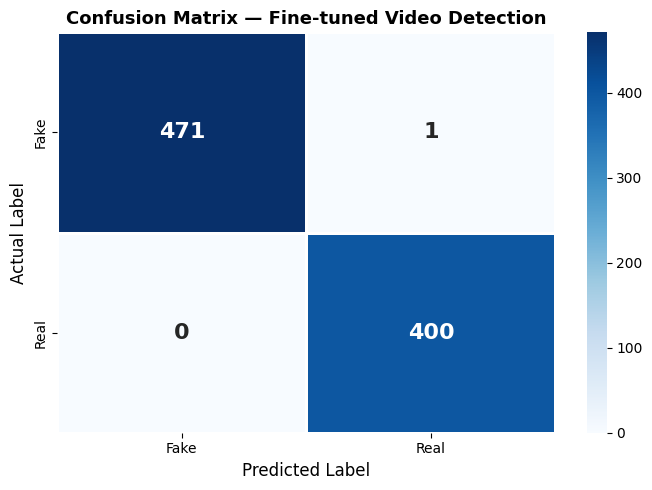

✅ Confusion matrix saved!


In [ ]:
# Now test clip-level accuracy with fine-tuned model
print("🔍 Re-evaluating on full video clips...")
print("=" * 58)

results_ft    = []
correct_total = 0

for idx, (folder, actual) in enumerate(real_clips + fake_clips):
    pred, conf_real, conf_fake, frame_probs = \
        predict_clip(folder, model, device)

    if pred is None:
        continue

    correct = (actual=="Real" and "REAL"    in pred) or \
              (actual=="Fake" and "DEEPFAKE" in pred)
    if correct:
        correct_total += 1

    results_ft.append({
        "clip"      : os.path.basename(folder),
        "actual"    : actual,
        "predicted" : pred,
        "conf_real" : round(conf_real, 2),
        "conf_fake" : round(conf_fake, 2),
        "correct"   : correct
    })

y_true_ft = [1 if r['actual']=="Real" else 0 for r in results_ft]
y_pred_ft = [1 if "REAL" in r['predicted'] else 0
             for r in results_ft]

acc_ft  = accuracy_score(y_true_ft,  y_pred_ft)
prec_ft = precision_score(y_true_ft, y_pred_ft, zero_division=0)
rec_ft  = recall_score(y_true_ft,    y_pred_ft, zero_division=0)
f1_ft   = f1_score(y_true_ft,        y_pred_ft, zero_division=0)

print(f"\n{'='*50}")
print(f"  📊 CLIP-LEVEL RESULTS — AFTER FINE-TUNING")
print(f"{'='*50}")
print(f"  Accuracy  : {acc_ft*100:.2f}%")
print(f"  Precision : {prec_ft*100:.2f}%")
print(f"  Recall    : {rec_ft*100:.2f}%")
print(f"  F1-Score  : {f1_ft*100:.2f}%")
print(f"{'='*50}")
print(f"\n📈 Improvement over baseline:")
print(f"   Before : 55.16%")
print(f"   After  : {acc_ft*100:.2f}%")
print(f"   Gain   : +{acc_ft*100-55.16:.2f}%")

# Save confusion matrix
import matplotlib.pyplot as plt
import seaborn as sns

cm = confusion_matrix(y_true_ft, y_pred_ft)
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Fake','Real'],
            yticklabels=['Fake','Real'],
            linewidths=2, linecolor='white',
            annot_kws={"size":16,"weight":"bold"})
plt.title('Confusion Matrix — Fine-tuned Video Detection',
          fontsize=13, fontweight='bold')
plt.ylabel('Actual Label',    fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.tight_layout()
plt.savefig(f"{GRAPHS_SAVE_PATH}/video_finetuned_confusion.png",
            dpi=150, bbox_inches='tight')
plt.show()
print("✅ Confusion matrix saved!")

🧪 Testing Random Video Clips

🟢 REAL CLIPS:


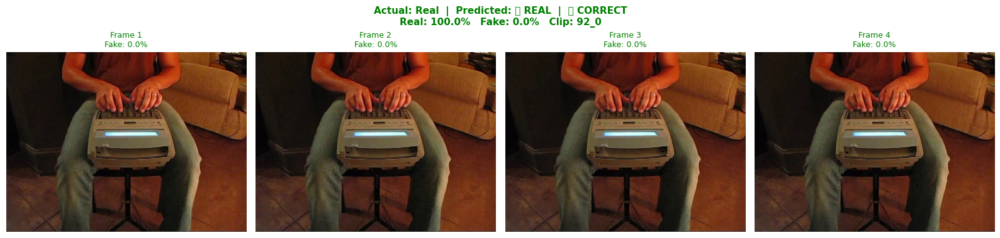

Clip     : 92_0
Actual   : Real
Predicted: 🟢 REAL  ✅ CORRECT
Real: 100.0%  |  Fake: 0.0%
-------------------------------------------------------


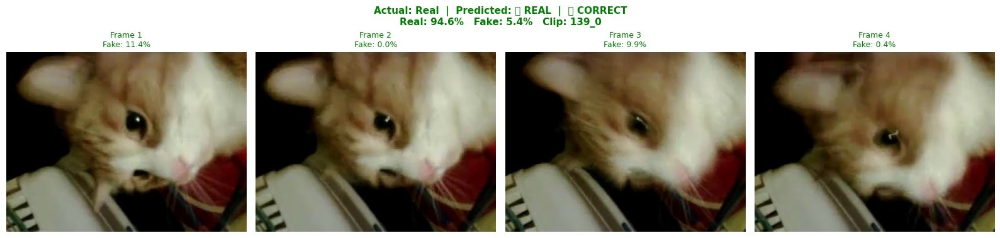

Clip     : 139_0
Actual   : Real
Predicted: 🟢 REAL  ✅ CORRECT
Real: 94.6%  |  Fake: 5.4%
-------------------------------------------------------


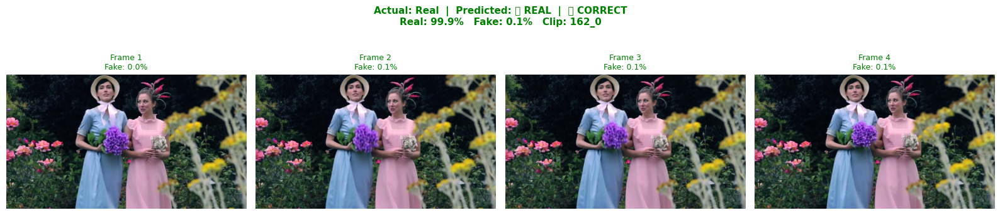

Clip     : 162_0
Actual   : Real
Predicted: 🟢 REAL  ✅ CORRECT
Real: 99.9%  |  Fake: 0.1%
-------------------------------------------------------

🔴 FAKE CLIPS:


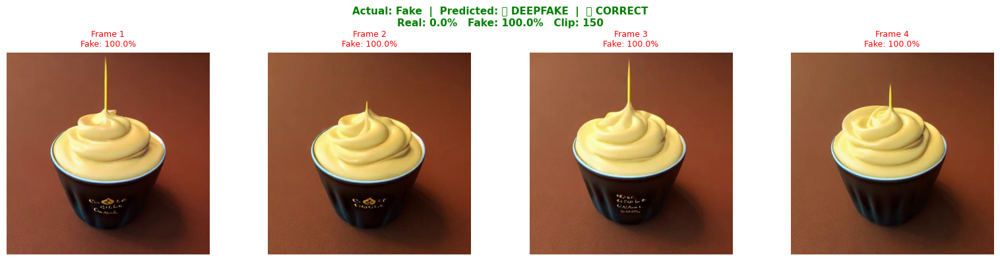

Clip     : 150
Actual   : Fake
Predicted: 🔴 DEEPFAKE  ✅ CORRECT
Real: 0.0%  |  Fake: 100.0%
-------------------------------------------------------


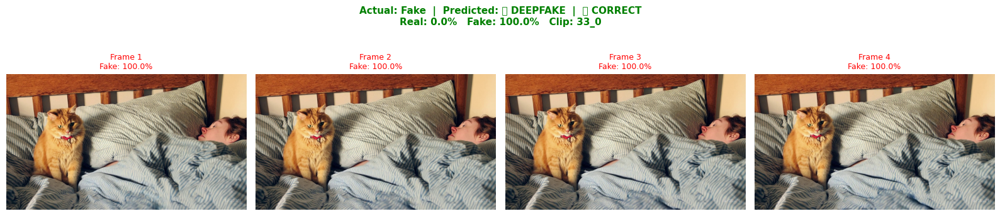

Clip     : 33_0
Actual   : Fake
Predicted: 🔴 DEEPFAKE  ✅ CORRECT
Real: 0.0%  |  Fake: 100.0%
-------------------------------------------------------


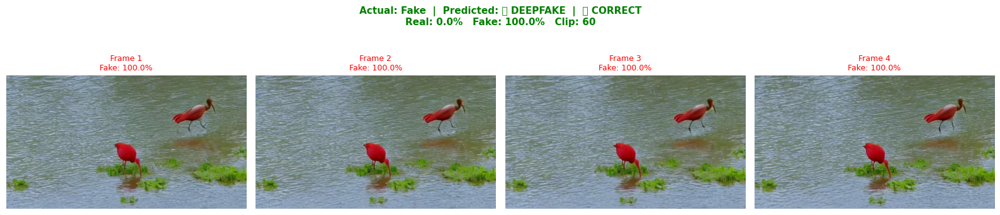

Clip     : 60
Actual   : Fake
Predicted: 🔴 DEEPFAKE  ✅ CORRECT
Real: 0.0%  |  Fake: 100.0%
-------------------------------------------------------


In [ ]:
import random
import matplotlib.pyplot as plt
from PIL import Image
import os

def test_clip_visual(folder, actual, model, device, max_frames=4):
    """Test a clip and show frames with predictions."""
    pred, conf_real, conf_fake, frame_probs = \
        predict_clip(folder, model, device)

    correct = (actual=="Real" and "REAL"    in pred) or \
              (actual=="Fake" and "DEEPFAKE" in pred)
    status  = "✅ CORRECT" if correct else "❌ WRONG"
    color   = "green" if correct else "red"

    # Get frame files
    frame_files = sorted([
        f for f in os.listdir(folder)
        if f.lower().endswith(('.jpg','.jpeg','.png'))
    ])[:max_frames]

    fig, axes = plt.subplots(1, len(frame_files), figsize=(16, 4))
    if len(frame_files) == 1:
        axes = [axes]

    for i, (fname, ax) in enumerate(zip(frame_files, axes)):
        img = Image.open(os.path.join(folder, fname)).convert('RGB')
        ax.imshow(img)
        ax.axis('off')
        fp = frame_probs[i] if i < len(frame_probs) else 0
        ax.set_title(f"Frame {i+1}\nFake: {fp*100:.1f}%",
                     fontsize=9,
                     color='red' if fp >= 0.5 else 'green')

    fig.suptitle(
        f"Actual: {actual}  |  Predicted: {pred}  |  {status}\n"
        f"Real: {conf_real:.1f}%   Fake: {conf_fake:.1f}%   "
        f"Clip: {os.path.basename(folder)}",
        fontsize=11, fontweight='bold', color=color)
    plt.tight_layout()
    plt.show()

    print(f"Clip     : {os.path.basename(folder)}")
    print(f"Actual   : {actual}")
    print(f"Predicted: {pred}  {status}")
    print(f"Real: {conf_real:.1f}%  |  Fake: {conf_fake:.1f}%")
    print("-" * 55)


# ── Test 3 random Real + 3 random Fake clips ────────────────
print("🧪 Testing Random Video Clips")
print("=" * 55)

print("\n🟢 REAL CLIPS:")
for folder, actual in random.sample(real_clips, 3):
    test_clip_visual(folder, actual, model, device)

print("\n🔴 FAKE CLIPS:")
for folder, actual in random.sample(fake_clips, 3):
    test_clip_visual(folder, actual, model, device)

📂 Upload a video file (mp4, avi, mov)...
   Can be any face video — selfie, news clip, etc.


Saving WIN_20260528_17_13_46_Pro.mp4 to WIN_20260528_17_13_46_Pro.mp4

✅ Uploaded: WIN_20260528_17_13_46_Pro.mp4


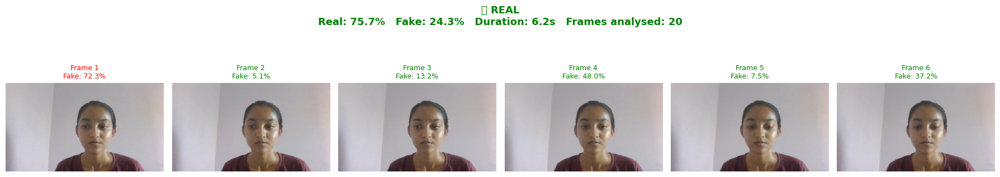

  🎬 Video Analysis Complete
  File     : WIN_20260528_17_13_46_Pro.mp4
  Duration : 6.2 seconds
  FPS      : 15.1
  Frames   : 20 analysed
  Result   : 🟢 REAL
  Real     : 75.7%
  Fake     : 24.3%


In [ ]:
import cv2
import numpy as np
from google.colab import files

def predict_own_video(video_path, model, device,
                      num_frames=20):
    """
    Test your own video file.
    Extracts frames using OpenCV → runs through fine-tuned model.
    """
    cap      = cv2.VideoCapture(video_path)
    total    = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps      = cap.get(cv2.CAP_PROP_FPS)
    duration = total / fps if fps > 0 else 0

    if total == 0:
        print("❌ Cannot read video!")
        return

    # Extract evenly spaced frames
    indices = np.linspace(0, total-1,
                          min(num_frames, total),
                          dtype=int)
    frames     = []
    fake_probs = []

    frame_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225])
    ])

    model.eval()
    with torch.no_grad():
        for idx in indices:
            cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
            ret, frame = cap.read()
            if ret:
                frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                pil_img   = Image.fromarray(frame_rgb)
                frames.append(pil_img)
                tensor    = frame_transform(pil_img).unsqueeze(0).to(device)
                probs     = torch.softmax(model(tensor), dim=1)
                fake_probs.append(probs[0][0].item())
    cap.release()

    if not frames:
        print("❌ No frames extracted!")
        return

    avg_fake  = np.mean(fake_probs)
    avg_real  = 1 - avg_fake
    pred      = "🔴 DEEPFAKE" if avg_fake >= 0.5 else "🟢 REAL"
    conf_fake = avg_fake * 100
    conf_real = avg_real * 100
    color     = 'red' if 'DEEPFAKE' in pred else 'green'

    # Show extracted frames
    show_n = min(6, len(frames))
    fig, axes = plt.subplots(1, show_n, figsize=(18, 4))
    if show_n == 1:
        axes = [axes]

    for i, (frame, ax) in enumerate(zip(frames[:show_n], axes)):
        fp = fake_probs[i] if i < len(fake_probs) else 0
        ax.imshow(frame)
        ax.axis('off')
        ax.set_title(f"Frame {i+1}\nFake: {fp*100:.1f}%",
                     fontsize=9,
                     color='red' if fp >= 0.5 else 'green')

    fig.suptitle(
        f"{pred}\n"
        f"Real: {conf_real:.1f}%   Fake: {conf_fake:.1f}%   "
        f"Duration: {duration:.1f}s   Frames analysed: {len(frames)}",
        fontsize=13, fontweight='bold', color=color)
    plt.tight_layout()
    plt.show()

    print("=" * 55)
    print(f"  🎬 Video Analysis Complete")
    print("=" * 55)
    print(f"  File     : {os.path.basename(video_path)}")
    print(f"  Duration : {duration:.1f} seconds")
    print(f"  FPS      : {fps:.1f}")
    print(f"  Frames   : {len(frames)} analysed")
    print(f"  Result   : {pred}")
    print(f"  Real     : {conf_real:.1f}%")
    print(f"  Fake     : {conf_fake:.1f}%")
    print("=" * 55)


# ── Upload your own video ────────────────────────────────────
print("📂 Upload a video file (mp4, avi, mov)...")
print("   Can be any face video — selfie, news clip, etc.")
uploaded = files.upload()

if uploaded:
    video_path = list(uploaded.keys())[0]
    print(f"\n✅ Uploaded: {video_path}")
    predict_own_video(video_path, model, device, num_frames=20)
else:
    print("No file uploaded.")

📂 Upload a video file (mp4, avi, mov)...
   Can be any face video — selfie, news clip, etc.


Saving Dheema Video Song (Telugu) _ Love Insurance Kompany _ Pradeep Ranganathan _ Anirudh _ Vignesh Shivan - YouTube - Google Chrome 2026-05-28 17-16-42.mp4 to Dheema Video Song (Telugu) _ Love Insurance Kompany _ Pradeep Ranganathan _ Anirudh _ Vignesh Shivan - YouTube - Google Chrome 2026-05-28 17-16-42.mp4

✅ Uploaded: Dheema Video Song (Telugu) _ Love Insurance Kompany _ Pradeep Ranganathan _ Anirudh _ Vignesh Shivan - YouTube - Google Chrome 2026-05-28 17-16-42.mp4


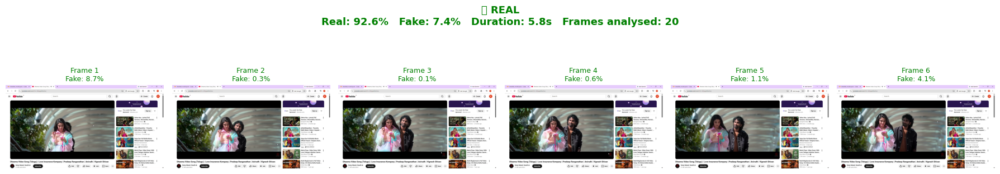

  🎬 Video Analysis Complete
  File     : Dheema Video Song (Telugu) _ Love Insurance Kompany _ Pradeep Ranganathan _ Anirudh _ Vignesh Shivan - YouTube - Google Chrome 2026-05-28 17-16-42.mp4
  Duration : 5.8 seconds
  FPS      : 26.3
  Frames   : 20 analysed
  Result   : 🟢 REAL
  Real     : 92.6%
  Fake     : 7.4%


In [ ]:
import cv2
import numpy as np
from google.colab import files

def predict_own_video(video_path, model, device,
                      num_frames=20):
    """
    Test your own video file.
    Extracts frames using OpenCV → runs through fine-tuned model.
    """
    cap      = cv2.VideoCapture(video_path)
    total    = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps      = cap.get(cv2.CAP_PROP_FPS)
    duration = total / fps if fps > 0 else 0

    if total == 0:
        print("❌ Cannot read video!")
        return

    # Extract evenly spaced frames
    indices = np.linspace(0, total-1,
                          min(num_frames, total),
                          dtype=int)
    frames     = []
    fake_probs = []

    frame_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225])
    ])

    model.eval()
    with torch.no_grad():
        for idx in indices:
            cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
            ret, frame = cap.read()
            if ret:
                frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                pil_img   = Image.fromarray(frame_rgb)
                frames.append(pil_img)
                tensor    = frame_transform(pil_img).unsqueeze(0).to(device)
                probs     = torch.softmax(model(tensor), dim=1)
                fake_probs.append(probs[0][0].item())
    cap.release()

    if not frames:
        print("❌ No frames extracted!")
        return

    avg_fake  = np.mean(fake_probs)
    avg_real  = 1 - avg_fake
    pred      = "🔴 DEEPFAKE" if avg_fake >= 0.5 else "🟢 REAL"
    conf_fake = avg_fake * 100
    conf_real = avg_real * 100
    color     = 'red' if 'DEEPFAKE' in pred else 'green'

    # Show extracted frames
    show_n = min(6, len(frames))
    fig, axes = plt.subplots(1, show_n, figsize=(18, 4))
    if show_n == 1:
        axes = [axes]

    for i, (frame, ax) in enumerate(zip(frames[:show_n], axes)):
        fp = fake_probs[i] if i < len(fake_probs) else 0
        ax.imshow(frame)
        ax.axis('off')
        ax.set_title(f"Frame {i+1}\nFake: {fp*100:.1f}%",
                     fontsize=9,
                     color='red' if fp >= 0.5 else 'green')

    fig.suptitle(
        f"{pred}\n"
        f"Real: {conf_real:.1f}%   Fake: {conf_fake:.1f}%   "
        f"Duration: {duration:.1f}s   Frames analysed: {len(frames)}",
        fontsize=13, fontweight='bold', color=color)
    plt.tight_layout()
    plt.show()

    print("=" * 55)
    print(f"  🎬 Video Analysis Complete")
    print("=" * 55)
    print(f"  File     : {os.path.basename(video_path)}")
    print(f"  Duration : {duration:.1f} seconds")
    print(f"  FPS      : {fps:.1f}")
    print(f"  Frames   : {len(frames)} analysed")
    print(f"  Result   : {pred}")
    print(f"  Real     : {conf_real:.1f}%")
    print(f"  Fake     : {conf_fake:.1f}%")
    print("=" * 55)


# ── Upload your own video ────────────────────────────────────
print("📂 Upload a video file (mp4, avi, mov)...")
print("   Can be any face video — selfie, news clip, etc.")
uploaded = files.upload()

if uploaded:
    video_path = list(uploaded.keys())[0]
    print(f"\n✅ Uploaded: {video_path}")
    predict_own_video(video_path, model, device, num_frames=20)
else:
    print("No file uploaded.")

📂 Upload a video file (mp4, avi, mov)...
   Can be any face video — selfie, news clip, etc.


Saving Dheema Video Song (Telugu) _ Love Insurance Kompany _ Pradeep Ranganathan _ Anirudh _ Vignesh Shivan - YouTube - Google Chrome 2026-05-28 17-18-53.mp4 to Dheema Video Song (Telugu) _ Love Insurance Kompany _ Pradeep Ranganathan _ Anirudh _ Vignesh Shivan - YouTube - Google Chrome 2026-05-28 17-18-53.mp4

✅ Uploaded: Dheema Video Song (Telugu) _ Love Insurance Kompany _ Pradeep Ranganathan _ Anirudh _ Vignesh Shivan - YouTube - Google Chrome 2026-05-28 17-18-53.mp4


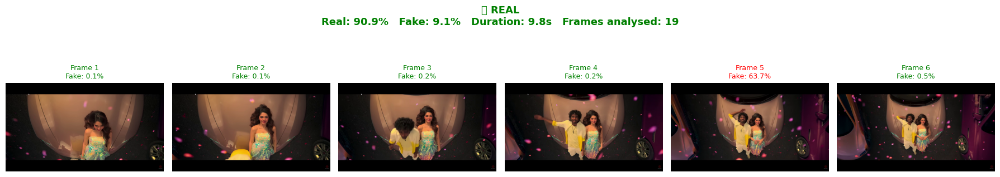

  🎬 Video Analysis Complete
  File     : Dheema Video Song (Telugu) _ Love Insurance Kompany _ Pradeep Ranganathan _ Anirudh _ Vignesh Shivan - YouTube - Google Chrome 2026-05-28 17-18-53.mp4
  Duration : 9.8 seconds
  FPS      : 26.9
  Frames   : 19 analysed
  Result   : 🟢 REAL
  Real     : 90.9%
  Fake     : 9.1%


In [ ]:
import cv2
import numpy as np
from google.colab import files

def predict_own_video(video_path, model, device,
                      num_frames=20):
    """
    Test your own video file.
    Extracts frames using OpenCV → runs through fine-tuned model.
    """
    cap      = cv2.VideoCapture(video_path)
    total    = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps      = cap.get(cv2.CAP_PROP_FPS)
    duration = total / fps if fps > 0 else 0

    if total == 0:
        print("❌ Cannot read video!")
        return

    # Extract evenly spaced frames
    indices = np.linspace(0, total-1,
                          min(num_frames, total),
                          dtype=int)
    frames     = []
    fake_probs = []

    frame_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225])
    ])

    model.eval()
    with torch.no_grad():
        for idx in indices:
            cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
            ret, frame = cap.read()
            if ret:
                frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                pil_img   = Image.fromarray(frame_rgb)
                frames.append(pil_img)
                tensor    = frame_transform(pil_img).unsqueeze(0).to(device)
                probs     = torch.softmax(model(tensor), dim=1)
                fake_probs.append(probs[0][0].item())
    cap.release()

    if not frames:
        print("❌ No frames extracted!")
        return

    avg_fake  = np.mean(fake_probs)
    avg_real  = 1 - avg_fake
    pred      = "🔴 DEEPFAKE" if avg_fake >= 0.5 else "🟢 REAL"
    conf_fake = avg_fake * 100
    conf_real = avg_real * 100
    color     = 'red' if 'DEEPFAKE' in pred else 'green'

    # Show extracted frames
    show_n = min(6, len(frames))
    fig, axes = plt.subplots(1, show_n, figsize=(18, 4))
    if show_n == 1:
        axes = [axes]

    for i, (frame, ax) in enumerate(zip(frames[:show_n], axes)):
        fp = fake_probs[i] if i < len(fake_probs) else 0
        ax.imshow(frame)
        ax.axis('off')
        ax.set_title(f"Frame {i+1}\nFake: {fp*100:.1f}%",
                     fontsize=9,
                     color='red' if fp >= 0.5 else 'green')

    fig.suptitle(
        f"{pred}\n"
        f"Real: {conf_real:.1f}%   Fake: {conf_fake:.1f}%   "
        f"Duration: {duration:.1f}s   Frames analysed: {len(frames)}",
        fontsize=13, fontweight='bold', color=color)
    plt.tight_layout()
    plt.show()

    print("=" * 55)
    print(f"  🎬 Video Analysis Complete")
    print("=" * 55)
    print(f"  File     : {os.path.basename(video_path)}")
    print(f"  Duration : {duration:.1f} seconds")
    print(f"  FPS      : {fps:.1f}")
    print(f"  Frames   : {len(frames)} analysed")
    print(f"  Result   : {pred}")
    print(f"  Real     : {conf_real:.1f}%")
    print(f"  Fake     : {conf_fake:.1f}%")
    print("=" * 55)


# ── Upload your own video ────────────────────────────────────
print("📂 Upload a video file (mp4, avi, mov)...")
print("   Can be any face video — selfie, news clip, etc.")
uploaded = files.upload()

if uploaded:
    video_path = list(uploaded.keys())[0]
    print(f"\n✅ Uploaded: {video_path}")
    predict_own_video(video_path, model, device, num_frames=20)
else:
    print("No file uploaded.")

📂 Upload a video file (mp4, avi, mov)...
   Can be any face video — selfie, news clip, etc.


Saving 01_02__exit_phone_room__YVGY8LOK.mp4 to 01_02__exit_phone_room__YVGY8LOK.mp4

✅ Uploaded: 01_02__exit_phone_room__YVGY8LOK.mp4


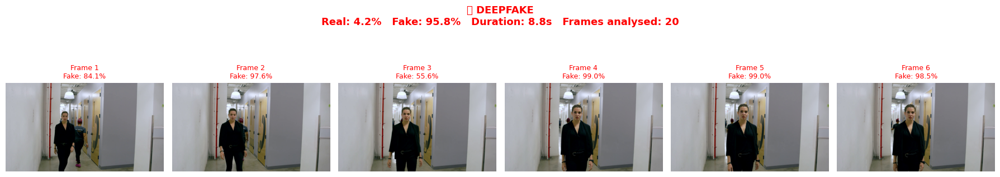

  🎬 Video Analysis Complete
  File     : 01_02__exit_phone_room__YVGY8LOK.mp4
  Duration : 8.8 seconds
  FPS      : 24.0
  Frames   : 20 analysed
  Result   : 🔴 DEEPFAKE
  Real     : 4.2%
  Fake     : 95.8%


In [ ]:
import cv2
import numpy as np
from google.colab import files

def predict_own_video(video_path, model, device,
                      num_frames=20):
    """
    Test your own video file.
    Extracts frames using OpenCV → runs through fine-tuned model.
    """
    cap      = cv2.VideoCapture(video_path)
    total    = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps      = cap.get(cv2.CAP_PROP_FPS)
    duration = total / fps if fps > 0 else 0

    if total == 0:
        print("❌ Cannot read video!")
        return

    # Extract evenly spaced frames
    indices = np.linspace(0, total-1,
                          min(num_frames, total),
                          dtype=int)
    frames     = []
    fake_probs = []

    frame_transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std =[0.229, 0.224, 0.225])
    ])

    model.eval()
    with torch.no_grad():
        for idx in indices:
            cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
            ret, frame = cap.read()
            if ret:
                frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                pil_img   = Image.fromarray(frame_rgb)
                frames.append(pil_img)
                tensor    = frame_transform(pil_img).unsqueeze(0).to(device)
                probs     = torch.softmax(model(tensor), dim=1)
                fake_probs.append(probs[0][0].item())
    cap.release()

    if not frames:
        print("❌ No frames extracted!")
        return

    avg_fake  = np.mean(fake_probs)
    avg_real  = 1 - avg_fake
    pred      = "🔴 DEEPFAKE" if avg_fake >= 0.5 else "🟢 REAL"
    conf_fake = avg_fake * 100
    conf_real = avg_real * 100
    color     = 'red' if 'DEEPFAKE' in pred else 'green'

    # Show extracted frames
    show_n = min(6, len(frames))
    fig, axes = plt.subplots(1, show_n, figsize=(18, 4))
    if show_n == 1:
        axes = [axes]

    for i, (frame, ax) in enumerate(zip(frames[:show_n], axes)):
        fp = fake_probs[i] if i < len(fake_probs) else 0
        ax.imshow(frame)
        ax.axis('off')
        ax.set_title(f"Frame {i+1}\nFake: {fp*100:.1f}%",
                     fontsize=9,
                     color='red' if fp >= 0.5 else 'green')

    fig.suptitle(
        f"{pred}\n"
        f"Real: {conf_real:.1f}%   Fake: {conf_fake:.1f}%   "
        f"Duration: {duration:.1f}s   Frames analysed: {len(frames)}",
        fontsize=13, fontweight='bold', color=color)
    plt.tight_layout()
    plt.show()

    print("=" * 55)
    print(f"  🎬 Video Analysis Complete")
    print("=" * 55)
    print(f"  File     : {os.path.basename(video_path)}")
    print(f"  Duration : {duration:.1f} seconds")
    print(f"  FPS      : {fps:.1f}")
    print(f"  Frames   : {len(frames)} analysed")
    print(f"  Result   : {pred}")
    print(f"  Real     : {conf_real:.1f}%")
    print(f"  Fake     : {conf_fake:.1f}%")
    print("=" * 55)


# ── Upload your own video ────────────────────────────────────
print("📂 Upload a video file (mp4, avi, mov)...")
print("   Can be any face video — selfie, news clip, etc.")
uploaded = files.upload()

if uploaded:
    video_path = list(uploaded.keys())[0]
    print(f"\n✅ Uploaded: {video_path}")
    predict_own_video(video_path, model, device, num_frames=20)
else:
    print("No file uploaded.")